![](images/Generic-Water-Well-Tanzania.jpg)

**Notebook #1: Pump it Up, Data Mining the Water Wells**

# Problem Description:

Though an open source coding effort Taarifa - a group of volunteer coders in Tanzania have put together a dashboard to monitor public infrastructure.  The data in this collection is on water well systems.  When communities are without water they suffer in many ways.  More time needs to be spent on water collection and less time can be spent on work or income generation.  Poor water sources may be used leading to health problems.  In some cases a broken well can cause death.

The Tanzanian government does not have the resources to continually inspect these wells and the communities they serve may not have the means to communicate to officals when the wells stop working.

The purpose of this project is to use the data to anticipate when a well needs repair, **ideally before it breaks** so the pump can be repaired before it disrupts the local water supply.

The primary focus of this work is to identify as many of the wells that need repair as possible from the existing data provided by Taarifa.

# Data Description

* `amount_tsh` - Total static head (amount water available to waterpoint)
* `date_recorded` - The date the row was entered
* `funder` - Who funded the well
* `gps_height` - Altitude of the well
* `installer` - Organization that installed the well
* `longitude` - GPS coordinate
* `latitude` - GPS coordinate
* `wpt_name` - Name of the waterpoint if there is one
* `num_private` -
* `basin` - Geographic water basin
* `subvillage` - Geographic location
* `region` - Geographic location
* `region_code` - Geographic location (coded)
* `district_code` - Geographic location (coded)
* `lga` - Geographic location
* `ward` - Geographic location
* `population` - Population around the well
* `public_meeting` - True/False
* `recorded_by` - Group entering this row of data
* `scheme_management` - Who operates the waterpoint
* `scheme_name` - Who operates the waterpoint
* `permit` - If the waterpoint is permitted
* `construction_year` - Year the waterpoint was constructed
* `extraction_type` - The kind of extraction the waterpoint uses
* `extraction_type_group` - The kind of extraction the waterpoint uses
* `extraction_type_class` - The kind of extraction the waterpoint uses
* `management` - How the waterpoint is managed
* `management_group` - How the waterpoint is managed
* `payment` - What the water costs
* `payment_type` - What the water costs
* `water_quality` - The quality of the water
* `quality_group` - The quality of the water
* `quantity` - The quantity of water
* `quantity_group` - The quantity of water
* `source` - The source of the water
* `source_type` - The source of the water
* `source_class` - The source of the water
* `waterpoint_type` - The kind of waterpoint
* `waterpoint_type_group` - The kind of waterpoint

# Imports and Data

In [1]:
import pandas as pd
import numpy as np

import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns

import folium
import json

from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import (FunctionTransformer, LabelEncoder, 
                                  OneHotEncoder, MinMaxScaler)
from sklearn.pipeline import FeatureUnion, Pipeline 
from sklearn.model_selection import GridSearchCV, RandomizedSearchCV
from sklearn.impute import SimpleImputer

from sklearn.tree import DecisionTreeClassifier

from sklearn import set_config

In [2]:
# Set the display with and length for tables
pd.set_option('display.max_columns', 50)
pd.set_option('display.max_rows', 100)

In [3]:
# import the data
X = pd.read_csv('data/train values.csv', index_col=0)
y = pd.read_csv('data/train labels.csv', index_col=0)
df = pd.concat([X, y], axis = 1)
df.head()

,amount_tsh,date_recorded,funder,gps_height,installer,longitude,latitude,wpt_name,num_private,basin,subvillage,region,region_code,district_code,lga,ward,population,public_meeting,recorded_by,scheme_management,scheme_name,permit,construction_year,extraction_type,extraction_type_group,extraction_type_class,management,management_group,payment,payment_type,water_quality,quality_group,quantity,quantity_group,source,source_type,source_class,waterpoint_type,waterpoint_type_group,status_group
id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
69572,6000.0,2011-03-14,Roman,1390,Roman,34.938093,-9.856322,none,0,Lake Nyasa,Mnyusi B,Iringa,11,5,Ludewa,Mundindi,109,True,GeoData Consultants Ltd,VWC,Roman,False,1999,gravity,gravity,gravity,vwc,user-group,pay annually,annually,soft,good,enough,enough,spring,spring,groundwater,communal standpipe,communal standpipe,functional
8776,0.0,2013-03-06,Grumeti,1399,GRUMETI,34.698766,-2.147466,Zahanati,0,Lake Victoria,Nyamara,Mara,20,2,Serengeti,Natta,280,NaN,GeoData Consultants Ltd,Other,NaN,True,2010,gravity,gravity,gravity,wug,user-group,never pay,never pay,soft,good,insufficient,insufficient,rainwater harvesting,rainwater harvesting,surface,communal standpipe,communal standpipe,functional
34310,25.0,2013-02-25,Lottery Club,686,World vision,37.460664,-3.821329,Kwa Mahundi,0,Pangani,Majengo,Manyara,21,4,Simanjiro,Ngorika,250,True,GeoData Consultants Ltd,VWC,Nyumba ya mungu pipe scheme,True,2009,gravity,gravity,gravity,vwc,user-group,pay per bucket,per bucket,soft,good,enough,enough,dam,dam,surface,communal standpipe multiple,communal standpipe,functional
67743,0.0,2013-01-28,Unicef,263,UNICEF,38.486161,-11.155298,Zahanati Ya Nanyumbu,0,Ruvuma / Southern Coast,Mahakamani,Mtwara,90,63,Nanyumbu,Nanyumbu,58,True,GeoData Consultants Ltd,VWC,NaN,True,1986,submersible,submersible,submersible,vwc,user-group,never pay,never pay,soft,good,dry,dry,machine dbh,borehole,groundwater,communal standpipe multiple,communal standpipe,non functional
19728,0.0,2011-07-13,Action In A,0,Artisan,31.130847,-1.825359,Shuleni,0,Lake Victoria,Kyanyamisa,Kagera,18,1,Karagwe,Nyakasimbi,0,True,GeoData Consultants Ltd,NaN,NaN,True,0,gravity,gravity,gravity,other,other,never pay,never pay,soft,good,seasonal,seasonal,rainwater harvesting,rainwater harvesting,surface,communal standpipe,communal standpipe,functional


In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 59400 entries, 69572 to 26348
Data columns (total 40 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   amount_tsh             59400 non-null  float64
 1   date_recorded          59400 non-null  object 
 2   funder                 55765 non-null  object 
 3   gps_height             59400 non-null  int64  
 4   installer              55745 non-null  object 
 5   longitude              59400 non-null  float64
 6   latitude               59400 non-null  float64
 7   wpt_name               59400 non-null  object 
 8   num_private            59400 non-null  int64  
 9   basin                  59400 non-null  object 
 10  subvillage             59029 non-null  object 
 11  region                 59400 non-null  object 
 12  region_code            59400 non-null  int64  
 13  district_code          59400 non-null  int64  
 14  lga                    59400 non-null  object 
 15

There are many object columns and some columns with names that may indicate they contain similar data.

In [5]:
df.describe()

,amount_tsh,gps_height,longitude,latitude,num_private,region_code,district_code,population,construction_year
count,59400.000000,59400.000000,59400.000000,5.940000e+04,59400.000000,59400.000000,59400.000000,59400.000000,59400.000000
mean,317.650385,668.297239,34.077427,-5.706033e+00,0.474141,15.297003,5.629747,179.909983,1300.652475
std,2997.574558,693.116350,6.567432,2.946019e+00,12.236230,17.587406,9.633649,471.482176,951.620547
min,0.000000,-90.000000,0.000000,-1.164944e+01,0.000000,1.000000,0.000000,0.000000,0.000000
25%,0.000000,0.000000,33.090347,-8.540621e+00,0.000000,5.000000,2.000000,0.000000,0.000000
50%,0.000000,369.000000,34.908743,-5.021597e+00,0.000000,12.000000,3.000000,25.000000,1986.000000
75%,20.000000,1319.250000,37.178387,-3.326156e+00,0.000000,17.000000,5.000000,215.000000,2004.000000
max,350000.000000,2770.000000,40.345193,-2.000000e-08,1776.000000,99.000000,80.000000,30500.000000,2013.000000


Several columns have a minimum value of 0 which seems to indicate that 0 is used as a placeholder for missing values.  Also latitude max -2.000000e-08 is far from the other values in the column so it is also a likely placeholder for missing values.

In [6]:
# check for na values
df.isna().sum()

amount_tsh                   0
date_recorded                0
funder                    3635
gps_height                   0
installer                 3655
longitude                    0
latitude                     0
wpt_name                     0
num_private                  0
basin                        0
subvillage                 371
region                       0
region_code                  0
district_code                0
lga                          0
ward                         0
population                   0
public_meeting            3334
recorded_by                  0
scheme_management         3877
scheme_name              28166
permit                    3056
construction_year            0
extraction_type              0
extraction_type_group        0
extraction_type_class        0
management                   0
management_group             0
payment                      0
payment_type                 0
water_quality                0
quality_group                0
quantity

`scheme_name` is missing nearly half the values.  Other missing values will need to be dealt with as well.

# Setup

Create a class for tracking the preprocessing decisions so they can all be found in one place.

In [7]:
# Empty class for keeping objects together.
class PreProcessingVars:
    def __init__(self):
        # store columns are categorical
        self.cat_cols = set()
        
        # store continuouse are categorical
        self.con_cols = set()
        
        # store columns that can benefit from log transformation
        self.log_cols = set()
        
prep = PreProcessingVars()

# check the instance to the values
prep.__dict__

{'cat_cols': set(), 'con_cols': set(), 'log_cols': set()}

In [8]:
## Column Transformer does not return column names if the feature transformes 
## do not provide get_feture_names().  This function gets the names from the
## input variables.  We don't need this for training the model but it is 
## helpful for testing along the way.
# Borrowed from https://johaupt.github.io/scikit-learn/tutorial/python/data%20processing/ml%20pipeline/model%20interpretation/columnTransformer_feature_names.html
from helpers import get_feature_names

# A custom transformer for reducing categorical columns
from helpers import filter_top_cats

# A custom transormer for Converting True/False text columns to integers
from helpers import boolstring_to_int

# A custom transformer for Date processing
from helpers import DatePrep

# Explore Data
## Well Locations

There are too many wells to visualize individually so visualize how many wells per state.

In [9]:
# Get the lat.long center of the map.  We have some 0 values so exclude those.
lat_center = (df.latitude[df['latitude'] != -2e-08].max() + df['latitude'].min()) / 2
long_center = (df['longitude'].max() + df.longitude[df['longitude'] != 0].min()) / 2

In [10]:
# import geojson data for states
with open('data/TZA_adm1_mkoaTZ.geojson', 'r') as jsonFile:
    region_json = json.load(jsonFile)

In [11]:
# extract the region names from the json file
region_names = [f['properties']['NAME_1'] for f in region_json['features']]
region_names

['Arusha',
 'Dar-Es-Salaam',
 'Dodoma',
 'Iringa',
 'Kagera',
 'Kaskazini-Pemba',
 'Kaskazini-Unguja',
 'Kigoma',
 'Kilimanjaro',
 'Kusini-Pemba',
 'Lindi',
 'Manyara',
 'Mara',
 'Mbeya',
 'Morogoro',
 'Mtwara',
 'Mwanza',
 'Pwani',
 'Rukwa',
 'Ruvuma',
 'Shinyanga',
 'Singida',
 'Tabora',
 'Tanga',
 'Zanzibar South and Central',
 'Zanzibar West']

In [12]:
len(region_names)

26

In [13]:
# compare the region information on our DataFrame with the regions in the GeoJson
pd.Series(df['region'].unique()).isin(region_names)

0      True
1      True
2      True
3      True
4      True
5      True
6      True
7      True
8      True
9      True
10     True
11     True
12     True
13     True
14     True
15     True
16     True
17     True
18     True
19     True
20    False
dtype: bool

In [14]:
# Look at the region that is not in region_names
df['region'].unique()[20]

'Dar es Salaam'

Looking back at region_names we can see that `Dar es Salaam` is represented as `Dar-es-Salaam`

In [15]:
# replace Dar es Salaam with Dar-Es-Salaam to match the geo data
df['region'] = df['region'].map(lambda x: 'Dar-Es-Salaam' if x == 'Dar es Salaam' else x)

In [16]:
pd.Series(df['region'].unique()).isin(region_names)

0     True
1     True
2     True
3     True
4     True
5     True
6     True
7     True
8     True
9     True
10    True
11    True
12    True
13    True
14    True
15    True
16    True
17    True
18    True
19    True
20    True
dtype: bool

Great, now we can map the number of wells to each region and create a choropleth map to show the number of wells in each region.

In [17]:
m = folium.Map(location=(lat_center, long_center), zoom_start=6, tiles='cartodbpositron',
              zoom_control=False)


folium.Choropleth(
    geo_data = region_json,                  #json
    name ='choropleth',                  
    data = df.groupby('region').count().reset_index(),                     
    columns = ['region', 'status_group'], #columns to work on
    key_on ='feature.properties.NAME_1',
    fill_color ='YlGnBu',     #I passed colors Yellow,Green,Blue
    fill_opacity = 0.7,
    line_opacity = 0.2,
    legend_name = "Number of pumps"
).add_to(m)

m

In [18]:
# number of pumps that need repair

m = folium.Map(location=(lat_center, long_center), zoom_start=6, tiles='cartodbpositron',
              zoom_control=False)


folium.Choropleth(
    geo_data = region_json,                  #json
    name ='choropleth',                  
    data = df[df['status_group'] != 'functional'].groupby('region').count().reset_index(),                     
    columns = ['region', 'status_group'], #columns to work on
    key_on ='feature.properties.NAME_1',
    fill_color ='YlGnBu',     #I passed colors Yellow,Green,Blue
    fill_opacity = 0.7,
    line_opacity = 0.2,
    legend_name = "Number of pumps needing repair"
).add_to(m)

m

## Dry wells

The word "Dry" comes up in the `quantity` column which indicates the amount of water available.  If a source is dry we would expect the pump to be non functional, but not in need of repair.  The problem isn't the pump its the source of water.

Lets look at the number of wells that have 'Dry' anywhere in their record and see how many of them are functional.

In [19]:
# create a bool column for whether a well is dry
tmp_df = df.copy()
tmp_df['dry'] = tmp_df['quantity'].str.contains('Dry', case=False)

<AxesSubplot:xlabel='status_group', ylabel='count'>

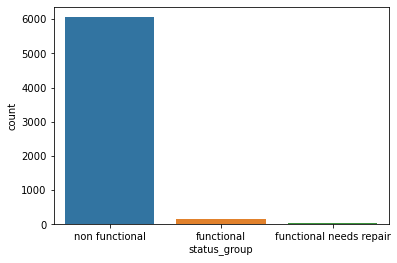

In [20]:
# plot the number of Dry wells in each status_group
sns.countplot(x = tmp_df[tmp_df['dry']]['status_group'])

Thats expected, we wouldn't expect a dry well to be functional.  But a dry well also doesn't need repair, its the source, not the equipment that is the problem.

Lets visualize the proportion of each status group that has dry in its record.

Text(0.5, 0, '')

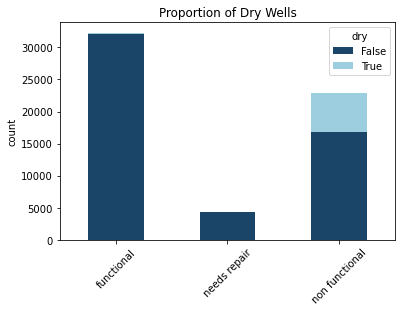

In [21]:
# group by dry, and status_group and count
summary = tmp_df[['dry', 'status_group', 'quantity']].groupby(['dry','status_group']).count()

# unstack and plot
summary.unstack().T.plot(kind='bar', stacked=True,
                         color={True: "#9dcedf", False: "#1a4568"})

# format
plt.xticks(ticks = [0, 1,2], labels = ['functional', 'needs repair', 'non functional'], rotation=45)
plt.title('Proportion of Dry Wells')
plt.ylabel('count')
plt.xlabel('')

Ok, so our suspicions are confirmed, but this visual doesn't immediately convey that because its hard to see the proportion of dry wells in the first two categories.

Try plotting all the data, not dry, and dry side by side.

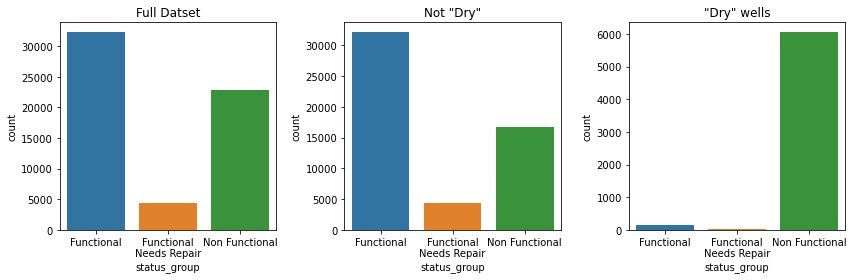

In [22]:
# create figure
fig, (ax1, ax2, ax3) = plt.subplots(1,3, figsize=(12,4))

# label order
order = ['functional', 'functional needs repair', 'non functional']
# display names
labels = ['Functional', 'Functional\nNeeds Repair', 'Non Functional']

# plot 1
sns.countplot(x=df['status_group'], order=order, ax = ax1)
ax1.set_title('Full Datset')
ax1.set_xticklabels(labels)

# plot 2
sns.countplot(x=tmp_df[~tmp_df['dry']]['status_group'], order=order, ax =ax2)
ax2.set_title('Not "Dry"')
ax2.set_xticklabels(labels)

# plot 3
sns.countplot(x=tmp_df[tmp_df['dry']]['status_group'], order=order,ax = ax3)
ax3.set_title('"Dry" wells')
ax3.set_xticklabels(labels) #, rotation=30, ha='right')

fig.tight_layout()

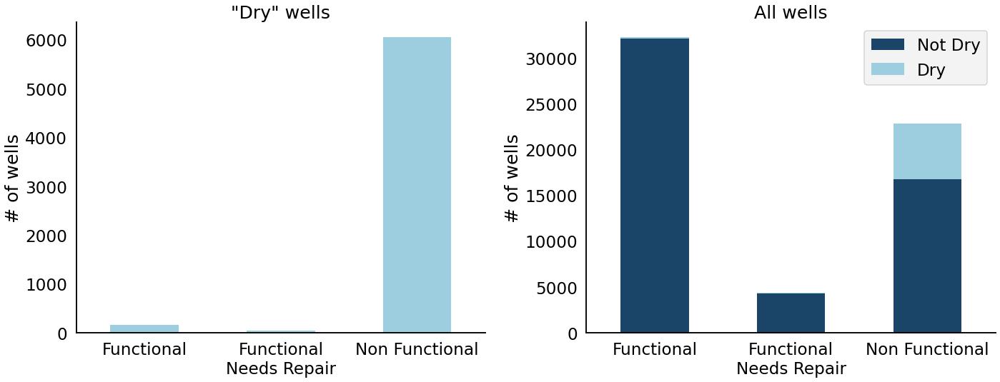

In [23]:
# Plot Dry wells and and proportion of All wells side by side for presentation

# set context for only this plot
with plt.style.context('fivethirtyeight'), sns.plotting_context("talk", font_scale=1.4):
    
    # create figure
    fig, (ax1, ax2) = plt.subplots(1,2, figsize=(20,8))

    # bar order
    order = ['functional', 'functional needs repair', 'non functional']
    # bar labels
    labels = ['Functional', 'Functional\nNeeds Repair', 'Non Functional']

    # Dry Wells plot
    vc = tmp_df[tmp_df['dry']]['status_group'].value_counts(sort=False)
    vc[order].plot(kind='bar', color="#9dcedf", ax=ax1)

    #formatting
    ax1.set_xticklabels(labels = labels, rotation=0)
    ax1.set_title('"Dry" wells')
    ax1.set_xticklabels(labels)
    ax1.set_ylabel('# of wells')
    ax1.grid(False)
    ax1.spines['right'].set_visible(False)
    ax1.spines['left'].set_color('black')
    ax1.spines['top'].set_visible(False)
    ax1.spines['bottom'].set_color('black')
    
    
    # Proportion of all wells
    summary.unstack().T.plot(kind='bar', stacked=True,
                             color={True: "#9dcedf", False: "#1a4568"},
                             ax=ax2)
    # format
    ax2.set_xticklabels(labels = labels, rotation=0)
    ax2.set_title('All wells')
    ax2.legend(labels=['Not Dry', 'Dry'])
    ax2.set_ylabel('# of wells')
    ax2.set_xlabel('')
    ax2.grid(False)
    ax2.spines['right'].set_visible(False)
    ax2.spines['left'].set_color('black')
    ax2.spines['top'].set_visible(False)
    ax2.spines['bottom'].set_color('black')
    
    # ticks and transparency
    fig.set_facecolor('None')
    ax1.tick_params(axis='both', bottom=False, left=False)
    ax1.set_facecolor('None')
    ax2.tick_params(axis='both', bottom=False, left=False)
    ax2.set_facecolor('None')

    fig.tight_layout()

## Extraction type class: submersible

Similar exploration of the `extraction_type_class` submersible. We want to see if it correlates to the `status_class` in any way.

In [24]:
# Percent of rows that contain the word 'submersible'
tmp_df = df.copy()
tmp_df['submersible'] = tmp_df['extraction_type_class'].str.contains('submersible', case=False)

<AxesSubplot:xlabel='status_group', ylabel='count'>

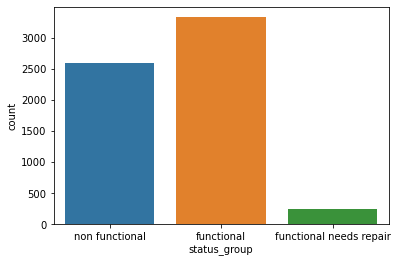

In [25]:
# plot status_group for submersible pumps
sns.countplot(x = tmp_df[tmp_df['submersible']]['status_group'])

Text(0.5, 0, '')

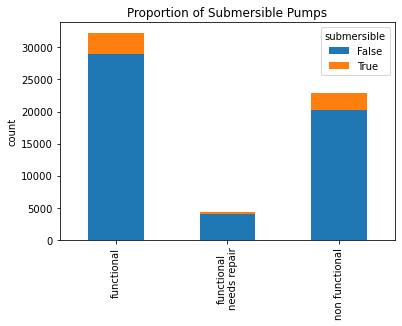

In [26]:
# count submersible by statys_group 
summary = tmp_df[
                    ['submersible', 'status_group', 'extraction_type']
                ].groupby(['submersible','status_group']).count()

# unstack and plot
summary.unstack().T.plot(kind='bar', stacked=True)

# format
plt.xticks(ticks = [0, 1,2], labels = ['functional', 'functional\nneeds repair', 'non functional'])
plt.title('Proportion of Submersible Pumps')
plt.ylabel('count')
plt.xlabel('')

Very few of the submersible type wells are functional need's repair.  This seems to indicates that the submersible pumps either work or don't which means that we might intervention strategies for these pumps that don't involve waiting for the pump to show signs of needing repair.

# Separate Continuous and Categorical Columns
## Continuous

In [27]:
df.select_dtypes('number')

,amount_tsh,gps_height,longitude,latitude,num_private,region_code,district_code,population,construction_year
id,,,,,,,,,
69572,6000.0,1390,34.938093,-9.856322,0,11,5,109,1999
8776,0.0,1399,34.698766,-2.147466,0,20,2,280,2010
34310,25.0,686,37.460664,-3.821329,0,21,4,250,2009
67743,0.0,263,38.486161,-11.155298,0,90,63,58,1986
19728,0.0,0,31.130847,-1.825359,0,18,1,0,0
...,...,...,...,...,...,...,...,...,...
60739,10.0,1210,37.169807,-3.253847,0,3,5,125,1999
27263,4700.0,1212,35.249991,-9.070629,0,11,4,56,1996
37057,0.0,0,34.017087,-8.750434,0,12,7,0,0


`district_code` and `region_code` appear to be categorical.  Check unique values to be sure.

In [28]:
# number of unique values per col
df.select_dtypes('number').nunique()

amount_tsh              98
gps_height            2428
longitude            57516
latitude             57517
num_private             65
region_code             27
district_code           20
population            1049
construction_year       55
dtype: int64

We can be pretty sure from this that `region_code` and `district_code` are categorical

In [29]:
# set of categorical columns
prep.cat_cols = {'region_code', 'district_code'}

# set of continuous columns by removing cat_cols from the con_cols
prep.con_cols = set(df.select_dtypes('number')) - prep.cat_cols
prep.con_cols

{'amount_tsh',
 'construction_year',
 'gps_height',
 'latitude',
 'longitude',
 'num_private',
 'population'}

In [30]:
prep.cat_cols

{'district_code', 'region_code'}

## Categoricals
Check to make sure none of the objects are actually Categorical

In [31]:
df.select_dtypes('object').head(2)

,date_recorded,funder,installer,wpt_name,basin,subvillage,region,lga,ward,public_meeting,recorded_by,scheme_management,scheme_name,permit,extraction_type,extraction_type_group,extraction_type_class,management,management_group,payment,payment_type,water_quality,quality_group,quantity,quantity_group,source,source_type,source_class,waterpoint_type,waterpoint_type_group,status_group
id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
69572,2011-03-14,Roman,Roman,none,Lake Nyasa,Mnyusi B,Iringa,Ludewa,Mundindi,True,GeoData Consultants Ltd,VWC,Roman,False,gravity,gravity,gravity,vwc,user-group,pay annually,annually,soft,good,enough,enough,spring,spring,groundwater,communal standpipe,communal standpipe,functional
8776,2013-03-06,Grumeti,GRUMETI,Zahanati,Lake Victoria,Nyamara,Mara,Serengeti,Natta,NaN,GeoData Consultants Ltd,Other,NaN,True,gravity,gravity,gravity,wug,user-group,never pay,never pay,soft,good,insufficient,insufficient,rainwater harvesting,rainwater harvesting,surface,communal standpipe,communal standpipe,functional


`date_recorded` should be date time.  The rest appear to be categorical.  We will change `date_recorded` to date_time but not include it in either the continuous or the the categorical column list because it will need to be converted to one of the other types later.

In [32]:
df['date_recorded'] = pd.to_datetime(df['date_recorded'])

In [33]:
# add these columns to con_cols
prep.cat_cols.update(df.select_dtypes('object').columns)

# remove date_recorded from cat_cols
prep.cat_cols.difference_update({'date_recorded'})


## Verify

In [34]:
# view continuouse columns
df[sorted(prep.con_cols)].head(2)

,amount_tsh,construction_year,gps_height,latitude,longitude,num_private,population
id,,,,,,,
69572,6000.0,1999,1390,-9.856322,34.938093,0,109
8776,0.0,2010,1399,-2.147466,34.698766,0,280


In [35]:
# view cateorical columns
df[sorted(prep.cat_cols)].head(2)

,basin,district_code,extraction_type,extraction_type_class,extraction_type_group,funder,installer,lga,management,management_group,payment,payment_type,permit,public_meeting,quality_group,quantity,quantity_group,recorded_by,region,region_code,scheme_management,scheme_name,source,source_class,source_type,status_group,subvillage,ward,water_quality,waterpoint_type,waterpoint_type_group,wpt_name
id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
69572,Lake Nyasa,5,gravity,gravity,gravity,Roman,Roman,Ludewa,vwc,user-group,pay annually,annually,False,True,good,enough,enough,GeoData Consultants Ltd,Iringa,11,VWC,Roman,spring,groundwater,spring,functional,Mnyusi B,Mundindi,soft,communal standpipe,communal standpipe,none
8776,Lake Victoria,2,gravity,gravity,gravity,Grumeti,GRUMETI,Serengeti,wug,user-group,never pay,never pay,True,NaN,good,insufficient,insufficient,GeoData Consultants Ltd,Mara,20,Other,NaN,rainwater harvesting,surface,rainwater harvesting,functional,Nyamara,Natta,soft,communal standpipe,communal standpipe,Zahanati


# Continuous Variables

In [36]:
# look at percentage of na values
df[prep.con_cols].isna().sum() / len(df)

construction_year    0.0
num_private          0.0
population           0.0
latitude             0.0
longitude            0.0
gps_height           0.0
amount_tsh           0.0
dtype: float64

In [37]:
# a function to consoldate the value counts into one table
def top_values(df, n = 5):
    '''Consoldate value_counts for all rows of a dataframe
into one dataframe for easy inspection

Parameters
----------
df: the dataframe to perform the value count on
n:  depth of count to include'''
    
    dfs = []
    for col in df.columns:
        vc = df[col].value_counts()
        values = pd.Series(vc).index[:n]
        counts = pd.Series(list(vc)[:n])
        df_tmp = pd.DataFrame([values, counts])
        df_tmp['col'] = col 
        df_tmp['vc'] = ['values', 'counts'] 
        df_tmp = df_tmp.set_index(['col', 'vc'])
        #df_tmp.columns = [(col, 'values'), (col, 'counts')]
        dfs.append(df_tmp)
    
    return pd.concat(dfs)
        

In [38]:
top_values(df[prep.con_cols], n=3).round(2) # rounded to avoid floating point

0        1        2
col               vc                               
construction_year values      0.0  2010.00  2008.00
                  counts  20709.0  2645.00  2613.00
num_private       values      0.0     6.00     1.00
                  counts  58643.0    81.00    73.00
population        values      0.0     1.00   200.00
                  counts  21381.0  7025.00  1940.00
latitude          values     -0.0    -2.49    -6.98
                  counts   1812.0     2.00     2.00
longitude         values      0.0    32.98    32.92
                  counts   1812.0     2.00     2.00
gps_height        values      0.0   -15.00   -16.00
                  counts  20438.0    60.00    55.00
amount_tsh        values      0.0   500.00    50.00
                  counts  41639.0  3102.00  2472.00

From the table we can see that there are some frequently occurring values that are clearly placeholders.  We will directly create our first pipelines to deal with these missing values so we can use the same processing for prediction.

Some values seem plausible like a `gps_height` of 0, but with 20k values it seems unlikely to be a real measurement.

`latitude` looks suspect and like we might not be able to match it with `-0.0`.  Inspect further to get the actual value.

`population` is unclear.  The population is the number of people who live near the well.  Near is not defined and its possible that some wells exist where there are no people, but for what purpose?  Because there are 21k wells listed as having 0 population we will treat that as na.

For `population` 0 we will treat as na.  Its unclear if we should also treat 1 as na because there are only 7k rows with this value and it is possible that they represent single houses or people with a well.  We will add it to the pipeline as a separate row so we can later test with and without it in our GridSearchCV.

In [39]:
# get the actual value of the na value for latitude
lat_na = df['latitude'].value_counts().head(1).index[0]
lat_na

-2e-08

## Create continuous pipelines
The start of our pipelines for preprocessing data

In [40]:
## Categorical columns
cont_cols = ['amount_tsh', 'gps_height', 'num_private', 
             'population', 'construction_year']

continuous_pipeline = Pipeline(
            steps = [
                ('imp', SimpleImputer(missing_values = 0, strategy='median'))
            ])

## Latitude and Longitude
latlong_cols = ['latitude', 'longitude']
latlong_pipeline = Pipeline(
            steps = [
                # Fill with median for now, will try other strategy in tuning
                ('imp0', SimpleImputer(missing_values = 0, strategy='median')),
                ('imp-0', SimpleImputer(missing_values = -2e-08, strategy='median'))
            ])

ct = ColumnTransformer(
    transformers = [
        ('cont', continuous_pipeline, cont_cols),
        ('latlong', latlong_pipeline, latlong_cols),
    ])

tmp_df = pd.DataFrame(ct.fit_transform(df), columns=get_feature_names(ct))

In [41]:
set_config(display='diagram')

ct

ColumnTransformer(transformers=[('cont',
                                 Pipeline(steps=[('imp',
                                                  SimpleImputer(missing_values=0,
                                                                strategy='median'))]),
                                 ['amount_tsh', 'gps_height', 'num_private',
                                  'population', 'construction_year']),
                                ('latlong',
                                 Pipeline(steps=[('imp0',
                                                  SimpleImputer(missing_values=0,
                                                                strategy='median')),
                                                 ('imp-0',
                                                  SimpleImputer(missing_values=-2e-08,
                                                                strategy='median'))]),
                                 ['latitude', 'longitude'])])

## Explore

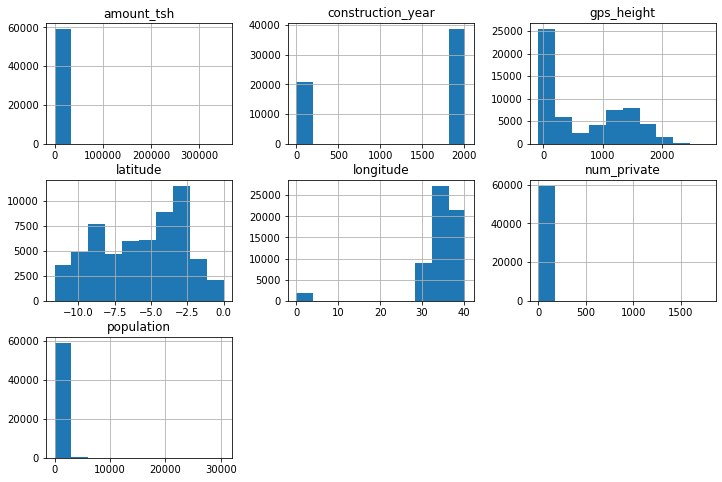

In [42]:
# visualize the column distributions
df[sorted(prep.con_cols)].hist(figsize = (12, 8));

`amount_tsh`, `num_private`, and `population` look like they have significant outliers.

### amount_tsh

In [43]:
# function to plot before/after log transform

def plot_log_compare(series):
    fig, ((ax1, ax2),(ax3, ax4)) = plt.subplots(2, 2, figsize = (12,6))

    sns.histplot(series, ax=ax1, bins=20)
    ax1.set_title('Original')
    sns.boxplot(x = series, ax = ax2)
    ax2.set_title('Original')

    sns.histplot(np.log1p(series), ax=ax3 , bins=20)
    ax3.set_title('Log Transformed')
    sns.boxplot(x = np.log1p(series), ax = ax4)
    ax4.set_title('Log Transformed')
    
    plt.tight_layout()


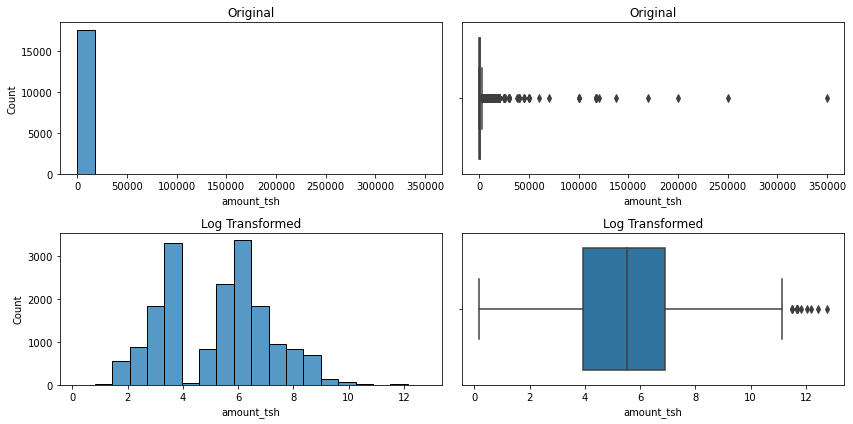

In [44]:
# plot for values greater than 0
plot_log_compare(df['amount_tsh'][df['amount_tsh'] > 0])

We would expect most bodies of water to be smaller and for there to be fewer pumps where there is more water.  But the distribution benefits from a log transformation which takes care of some of the outliers and makes the distribution more normal.  There is a huge spike at the median because of our imputing strategy.  This may be useful for some algorithms so we will add it to the pipeline so it can be tested with GridSearchCV later.

In [45]:
# add amount_tsh to the log transform list
prep.log_cols.add('amount_tsh')

Check the same on `num_private` and `polulation` Origional 

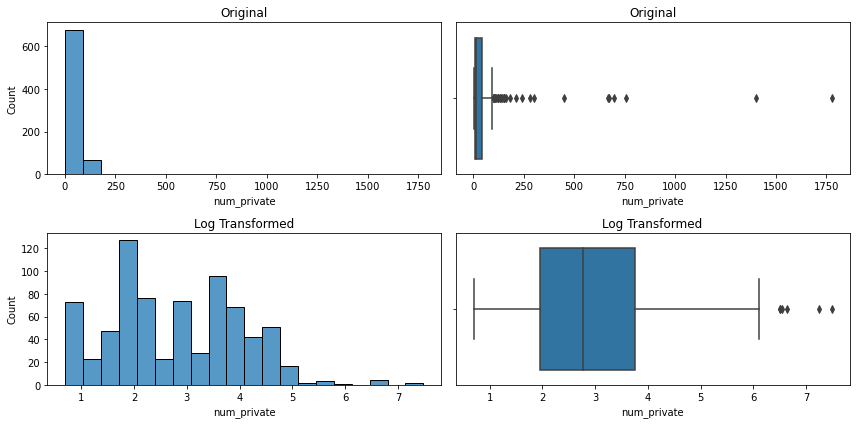

In [46]:
# plot log for num_private > 0
plot_log_compare(df['num_private'][df['num_private'] > 0])

In [47]:
# mark num_private for possible log transformation
prep.log_cols.add('num_private')

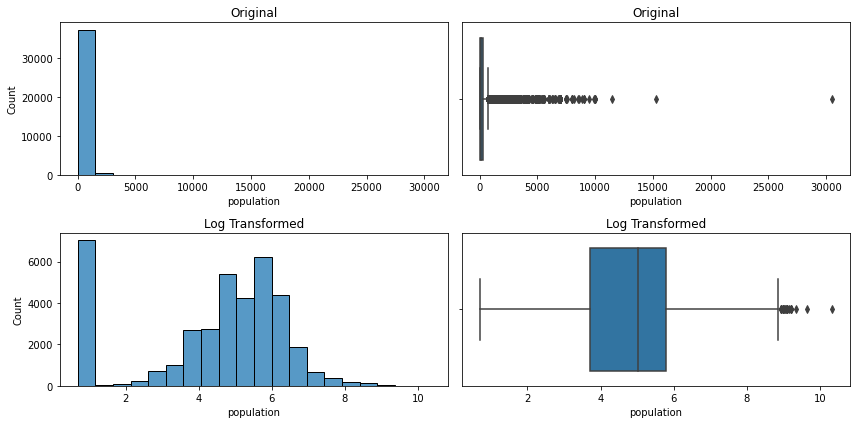

In [48]:
# plot population comparison
plot_log_compare(df['population'][df['population'] > 0])

In [49]:
# top values for population
df['population'].value_counts().head()

0      21381
1       7025
200     1940
150     1892
250     1681
Name: population, dtype: int64

Population also looks like it benefits but there are a huge number of outliers.  What does the distribution look like if we remove the 1's from the values?

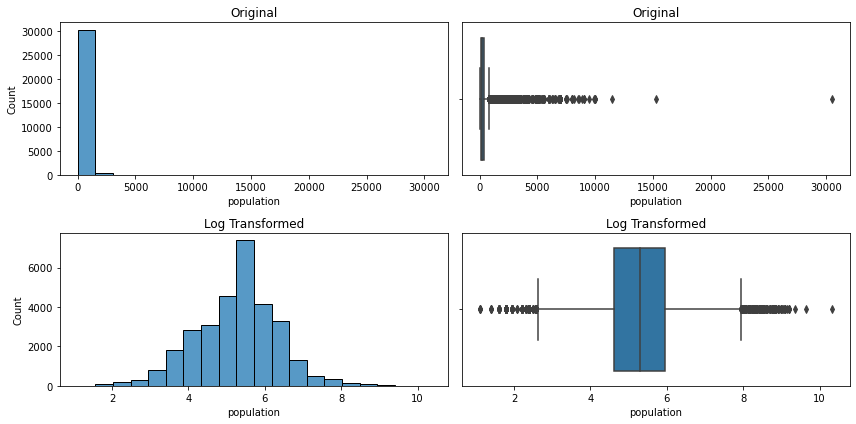

In [50]:
# Plot distribution without population = 1 values
plot_log_compare(df[df['population'] > 1].population)

We will impute the values 1 and 0 separately in the pipe line so we can test whether treating 1 as na has any effect on the model.

In [51]:
# mark for log transformation
prep.log_cols.add( 'population')

In [52]:
prep.log_cols

{'amount_tsh', 'num_private', 'population'}

### Test the pipeline so far

In [53]:
cont_cols = ['gps_height', 'construction_year']

continuous_pipeline = Pipeline(
            steps = [
                ('imp', SimpleImputer(missing_values = 0, strategy='median'))
            ])

##

population_cols = ['population']

population_pipeline = Pipeline(
            steps = [
                ('imp1', SimpleImputer(missing_values = 1, strategy='constant', fill_value=0)),
                ('imp0', SimpleImputer(missing_values = 0, strategy='median')),
                ('log', FunctionTransformer(np.log))
            ])

##

latlong_cols = ['latitude', 'longitude']

latlong_pipeline = Pipeline(
            steps = [
                # Fill with median for now, will try other strategy in tuning
                ('imp0', SimpleImputer(missing_values = 0, strategy='median')),
                ('imp-0', SimpleImputer(missing_values = -2e-08, strategy='median'))
            ])

##

log_cols = ['amount_tsh', 'num_private']
log_pipeline = Pipeline(
            steps = [
                ('imp', SimpleImputer(missing_values = 0, strategy='median')),
                ('log', FunctionTransformer(np.log))
            ])

ct = ColumnTransformer(
    transformers = [
        ('cont', continuous_pipeline, cont_cols),
        ('pop', population_pipeline, population_cols),
        ('latlong', latlong_pipeline, latlong_cols),
        ('log', log_pipeline, log_cols),
    ])

result = ct.fit_transform(df)
df_tx = pd.DataFrame(result, columns=get_feature_names(ct))
df_tx

,cont__gps_height,cont__construction_year,pop__population,latlong__latitude,latlong__longitude,log__amount_tsh,log__num_private
0,1390.0,1999.0,4.691348,-9.856322,34.938093,8.699515,2.70805
1,1399.0,2010.0,5.634790,-2.147466,34.698766,5.521461,2.70805
2,686.0,2009.0,5.521461,-3.821329,37.460664,3.218876,2.70805
3,263.0,1986.0,4.060443,-11.155298,38.486161,5.521461,2.70805
4,1167.0,2000.0,5.298317,-1.825359,31.130847,5.521461,2.70805
...,...,...,...,...,...,...,...
59395,1210.0,1999.0,4.828314,-3.253847,37.169807,2.302585,2.70805
59396,1212.0,1996.0,4.025352,-9.070629,35.249991,8.455318,2.70805
59397,1167.0,2000.0,5.298317,-8.750434,34.017087,5.521461,2.70805
59398,1167.0,2000.0,5.298317,-6.378573,35.861315,5.521461,2.70805


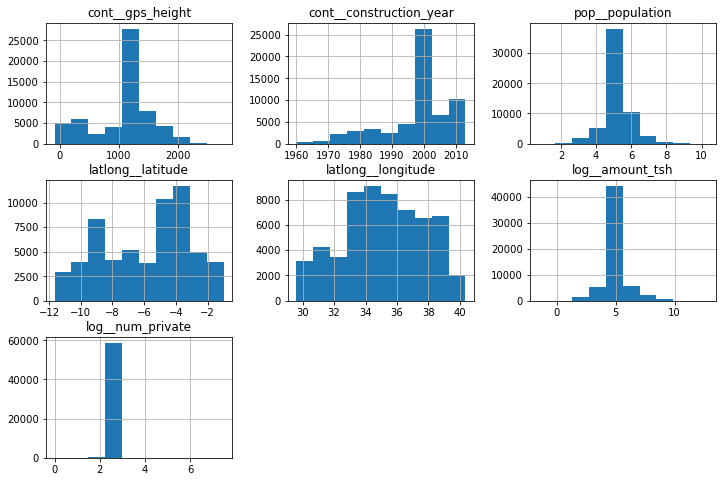

In [54]:
df_tx.hist(figsize = (12,8));

With the na's filled as median there are are spikes at the medians.  This is probably ok but we can try other fill strategies once the pipeline is complete.

# Categorical Variables

In [55]:
df[sorted(prep.cat_cols)].head()

,basin,district_code,extraction_type,extraction_type_class,extraction_type_group,funder,installer,lga,management,management_group,payment,payment_type,permit,public_meeting,quality_group,quantity,quantity_group,recorded_by,region,region_code,scheme_management,scheme_name,source,source_class,source_type,status_group,subvillage,ward,water_quality,waterpoint_type,waterpoint_type_group,wpt_name
id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
69572,Lake Nyasa,5,gravity,gravity,gravity,Roman,Roman,Ludewa,vwc,user-group,pay annually,annually,False,True,good,enough,enough,GeoData Consultants Ltd,Iringa,11,VWC,Roman,spring,groundwater,spring,functional,Mnyusi B,Mundindi,soft,communal standpipe,communal standpipe,none
8776,Lake Victoria,2,gravity,gravity,gravity,Grumeti,GRUMETI,Serengeti,wug,user-group,never pay,never pay,True,NaN,good,insufficient,insufficient,GeoData Consultants Ltd,Mara,20,Other,NaN,rainwater harvesting,surface,rainwater harvesting,functional,Nyamara,Natta,soft,communal standpipe,communal standpipe,Zahanati
34310,Pangani,4,gravity,gravity,gravity,Lottery Club,World vision,Simanjiro,vwc,user-group,pay per bucket,per bucket,True,True,good,enough,enough,GeoData Consultants Ltd,Manyara,21,VWC,Nyumba ya mungu pipe scheme,dam,surface,dam,functional,Majengo,Ngorika,soft,communal standpipe multiple,communal standpipe,Kwa Mahundi
67743,Ruvuma / Southern Coast,63,submersible,submersible,submersible,Unicef,UNICEF,Nanyumbu,vwc,user-group,never pay,never pay,True,True,good,dry,dry,GeoData Consultants Ltd,Mtwara,90,VWC,NaN,machine dbh,groundwater,borehole,non functional,Mahakamani,Nanyumbu,soft,communal standpipe multiple,communal standpipe,Zahanati Ya Nanyumbu
19728,Lake Victoria,1,gravity,gravity,gravity,Action In A,Artisan,Karagwe,other,other,never pay,never pay,True,True,good,seasonal,seasonal,GeoData Consultants Ltd,Kagera,18,NaN,NaN,rainwater harvesting,surface,rainwater harvesting,functional,Kyanyamisa,Nyakasimbi,soft,communal standpipe,communal standpipe,Shuleni


In [56]:
df[sorted(prep.cat_cols)].isna().sum()

basin                        0
district_code                0
extraction_type              0
extraction_type_class        0
extraction_type_group        0
funder                    3635
installer                 3655
lga                          0
management                   0
management_group             0
payment                      0
payment_type                 0
permit                    3056
public_meeting            3334
quality_group                0
quantity                     0
quantity_group               0
recorded_by                  0
region                       0
region_code                  0
scheme_management         3877
scheme_name              28166
source                       0
source_class                 0
source_type                  0
status_group                 0
subvillage                 371
ward                         0
water_quality                0
waterpoint_type              0
waterpoint_type_group        0
wpt_name                     0
dtype: i

## Drop Duplicate Columns

The following columns look suspiciously like duplicates:
* `extraction_type`	`extraction_type_class`	`extraction_type_group`
* `funder` `installer`
* `management` `management_group` `scheme_management`
* `payment`	`payment_type`
* `quantity` `quantity_group`
* `region`	`region_code`
* `source`	`source_class`	`source_type`
* `waterpoint_type`	`waterpoint_type_group`

In [57]:
# to quickly compare columns
def compare_cols(df):
    display(df.nunique())
    display(top_values(df, 10))

### `extraction_type`	`extraction_type_class`	`extraction_type_group`

In [58]:
compare_cols(df[['extraction_type','extraction_type_class','extraction_type_group']])

extraction_type          18
extraction_type_class     7
extraction_type_group    13
dtype: int64

0            1      2            3  \
col                   vc                                                 
extraction_type       values  gravity  nira/tanira  other  submersible   
                      counts    26780         8154   6430         4764   
extraction_type_class values  gravity     handpump  other  submersible   
                      counts    26780        16456   6430         6179   
extraction_type_group values  gravity  nira/tanira  other  submersible   
                      counts    26780         8154   6430         6179   

                                      4          5              6        7  \
col                   vc                                                     
extraction_type       values     swn 80       mono  india mark ii  afridev   
                      counts       3670       2865           2400     1770   
extraction_type_class values  motorpump  rope pump   wind-powered      NaN   
                      counts       2987        451            117      NaN   
extraction_type_group values     swn 80       mono  india mark ii  afridev   
                      counts       3670       2865           2400     1770   

                                      8                  9  
col                   vc                                    
extraction_type       values        ksb  other - rope pump  
                      counts       1415                451  
extraction_type_class values        NaN                NaN  
                      counts        NaN                NaN  
extraction_type_group values  rope pump     other handpump  
                      counts        451                364

`extraction_type_class` appears to be a more general classifier which is good for our purpose.  We don't want to have too many categorical values.  We will keep `extraction_type_class` and drop the other two.

In [59]:
# remove cols from cat_cols
prep.cat_cols.difference_update({'extraction_type', 'extraction_type_group'})
prep.cat_cols

{'basin',
 'district_code',
 'extraction_type_class',
 'funder',
 'installer',
 'lga',
 'management',
 'management_group',
 'payment',
 'payment_type',
 'permit',
 'public_meeting',
 'quality_group',
 'quantity',
 'quantity_group',
 'recorded_by',
 'region',
 'region_code',
 'scheme_management',
 'scheme_name',
 'source',
 'source_class',
 'source_type',
 'status_group',
 'subvillage',
 'ward',
 'water_quality',
 'waterpoint_type',
 'waterpoint_type_group',
 'wpt_name'}

### `funder`, `installer`

In [60]:
compare_cols(df[['funder', 'installer']])

funder       1897
installer    2145
dtype: int64

0           1       2      3  \
col       vc                                                          
funder    values  Government Of Tanzania      Danida  Hesawa  Rwssp   
          counts                    9084        3114    2202   1374   
installer values                     DWE  Government     RWE  Commu   
          counts                   17402        1825    1206   1060   

                           4     5             6       7      8  \
col       vc                                                      
funder    values  World Bank  Kkkt  World Vision  Unicef  Tasaf   
          counts        1349  1287          1246    1057    877   
installer values      DANIDA  KKKT        Hesawa       0   TCRS   
          counts        1050   898           840     777    707   

                                   9  
col       vc                          
funder    values    District Council  
          counts                 843  
installer values  Central government  
          counts                 622

`installer` and `funder` appear to be unique.

### `management` `management_group` `scheme_management`

In [61]:
compare_cols(df[['management', 'management_group', 'scheme_management']])

management           12
management_group      5
scheme_management    12
dtype: int64

0           1                2      3  \
col               vc                                                       
management        values         vwc         wug      water board    wua   
                  counts       40507        6515             2933   2535   
management_group  values  user-group  commercial       parastatal  other   
                  counts       52490        3638             1768    943   
scheme_management values         VWC         WUG  Water authority    WUA   
                  counts       36793        5206             3153   2883   

                                         4           5                 6  \
col               vc                                                       
management        values  private operator  parastatal   water authority   
                  counts              1971        1768               904   
management_group  values           unknown         NaN               NaN   
                  counts               561         NaN               NaN   
scheme_management values       Water Board  Parastatal  Private operator   
                  counts              2748        1680              1063   

                                7        8        9  
col               vc                                 
management        values    other  company  unknown  
                  counts      844      685      561  
management_group  values      NaN      NaN      NaN  
                  counts      NaN      NaN      NaN  
scheme_management values  Company    Other      SWC  
                  counts     1061      766       97

`management_group` appears unique.

`management` and `scheme_management` seem to indicate the same data, but there aren't the same number of values. Lets dig a little deeper.

In [62]:
# what percentage of the values are the same
(df['management'] == df['scheme_management'].str.lower()).sum() / len(df)

0.8305723905723905

In [63]:
# how many missing values
df[['management', 'scheme_management']].isna().sum()

management              0
scheme_management    3877
dtype: int64

In [64]:
# View values in management that correspond to the missing values in scheme_management
df[df['scheme_management'].isna()].management

id
19728               other
54551                 wug
46144                 vwc
34169                 vwc
20145                 vwc
               ...       
27957                 wug
6450              unknown
18917    private operator
14796             unknown
44616                 vwc
Name: management, Length: 3877, dtype: object

`management` is more complete than `scheme_management` so we will drop the latter

In [65]:
# remove from our working set
prep.cat_cols.remove('scheme_management')

### `payment`	`payment_type`

In [66]:
compare_cols(df[['payment', 'payment_type']])

payment         7
payment_type    7
dtype: int64

0               1            2        3  \
col          vc                                                        
payment      values  never pay  pay per bucket  pay monthly  unknown   
             counts      25348            8985         8300     8157   
payment_type values  never pay      per bucket      monthly  unknown   
             counts      25348            8985         8300     8157   

                                         4             5      6  
col          vc                                                  
payment      values  pay when scheme fails  pay annually  other  
             counts                   3914          3642   1054  
payment_type values             on failure      annually  other  
             counts                   3914          3642   1054

`payment` and `payment_type` are identical.  `payment_type` has more concise labels so we will keep it.

In [67]:
prep.cat_cols.difference_update({'payment'})

### `quantity` `quantity_group`

In [68]:
compare_cols(df[['quantity', 'quantity_group']])

quantity          5
quantity_group    5
dtype: int64

0             1     2         3        4
col            vc                                                   
quantity       values  enough  insufficient   dry  seasonal  unknown
               counts   33186         15129  6246      4050      789
quantity_group values  enough  insufficient   dry  seasonal  unknown
               counts   33186         15129  6246      4050      789

`quantity` and `quantity_group` are identical.  We will drop `quantity_group`

In [69]:
prep.cat_cols.difference_update({'quantity_group'})

### `region`	`region_code`

In [70]:
compare_cols(df[['region', 'region_code']])

region         21
region_code    27
dtype: int64

0          1      2            3         4       5  \
col         vc                                                                
region      values  Iringa  Shinyanga  Mbeya  Kilimanjaro  Morogoro  Arusha   
            counts    5294       4982   4639         4379      4006    3350   
region_code values      11         17     12            3         5      18   
            counts    5300       5011   4639         4379      4040    3324   

                         6       7       8       9  
col         vc                                      
region      values  Kagera  Mwanza  Kigoma  Ruvuma  
            counts    3316    3102    2816    2640  
region_code values      19       2      16      10  
            counts    3047    3024    2816    2640

In [71]:
# compare print region_codes that have more than one region associated with them
for i in np.sort(df['region_code'].unique()):
    u = df[df['region_code'] == i][['region', 'region_code']].nunique()
    
    if u['region'] > 1: 
        print('region_code:', i)
        print(df[df['region_code'] == i][['region', 'region_code']].nunique())

region_code: 5
region         2
region_code    1
dtype: int64
region_code: 11
region         2
region_code    1
dtype: int64
region_code: 14
region         2
region_code    1
dtype: int64
region_code: 17
region         2
region_code    1
dtype: int64
region_code: 18
region         2
region_code    1
dtype: int64


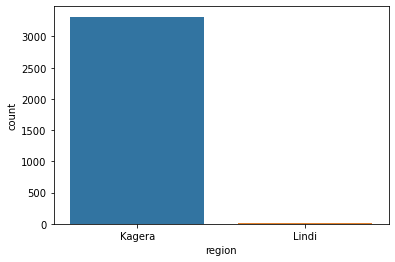

In [72]:
sns.countplot(x = df[df['region_code'] == 18]['region']);

So the region and region codes to not completely align, but they mostly do.  Since `region` has fewer values we will keep that and drop `region_code`.

In [73]:
# remove region_code from our working set
prep.cat_cols.difference_update({'region_code'})

### `source`	`source_class`	`source_type`

In [74]:
compare_cols(df[['source', 'source_class', 'source_type']])

source          10
source_class     3
source_type      7
dtype: int64

0             1            2           3  \
col          vc                                                           
source       values       spring  shallow well  machine dbh       river   
             counts        17021         16824        11075        9612   
source_class values  groundwater       surface      unknown         NaN   
             counts        45794         13328          278         NaN   
source_type  values       spring  shallow well     borehole  river/lake   
             counts        17021         16824        11949       10377   

                                        4         5      6    7      8  \
col          vc                                                          
source       values  rainwater harvesting  hand dtw   lake  dam  other   
             counts                  2295       874    765  656    212   
source_class values                   NaN       NaN    NaN  NaN    NaN   
             counts                   NaN       NaN    NaN  NaN    NaN   
source_type  values  rainwater harvesting       dam  other  NaN    NaN   
             counts                  2295       656    278  NaN    NaN   

                           9  
col          vc               
source       values  unknown  
             counts       66  
source_class values      NaN  
             counts      NaN  
source_type  values      NaN  
             counts      NaN

`source` and `source_type` are similar but source has more values.  Lets look at missing values for those columns.

In [75]:
df[['source', 'source_class', 'source_type']].isna().sum()

source          0
source_class    0
source_type     0
dtype: int64

It looks like each of these columns contain data about the same element, but some columns are more granular than others.  Lets take a look at whether any of these seem to correlate with `status_group`

source_class  source                source_type         
groundwater   spring                spring                  17021
              shallow well          shallow well            16824
              machine dbh           borehole                11075
surface       river                 river/lake               9612
              rainwater harvesting  rainwater harvesting     2295
groundwater   hand dtw              borehole                  874
surface       lake                  river/lake                765
              dam                   dam                       656
unknown       other                 other                     212
              unknown               other                      66
dtype: int64

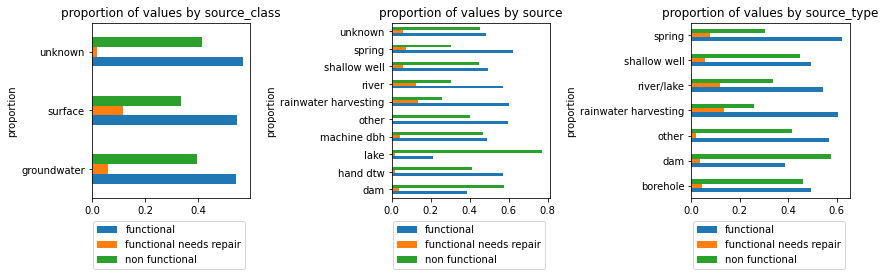

In [76]:
def plot_proportion(df, cols):
    
    fig, axs = plt.subplots(1, len(cols), figsize=(12,4))
    
    if len(cols) == 1:
        axs = [axs]
    
    for i, col in enumerate(cols):
    
        
        hm = df.groupby(col).status_group.value_counts(normalize = True).unstack()
        # display(hm)
        ax = axs[i]
        hm.plot.barh(ax=axs[i])
        ax.set_ylabel('proportion')
        ax.set_title('proportion of values by ' + col)
        #plt.show()
        #ax.legend()
        ax.legend(loc='upper right', bbox_to_anchor=(1, -0.1, 0, 0))
    plt.tight_layout()
    
    display(df[cols].value_counts())
plot_proportion(df, ['source_class', 'source', 'source_type'])

Looking at `source` we can see that a large proportion of the lake pumps are non functional.  And rainwater harvesting and river have a higher proportion of pumps that need repair.

Source seems to have more predictive information than the other classes so we are going keep source even though it has more columns than the other features.  We will drop `source_class` and `source_type`

In [77]:
prep.cat_cols.difference_update({'source_class', 'source_type'})

### `waterpoint_type`	`waterpoint_type_group`

In [78]:
compare_cols(df[['waterpoint_type', 'waterpoint_type_group']])

waterpoint_type          7
waterpoint_type_group    6
dtype: int64

0          1      2  \
col                   vc                                             
waterpoint_type       values  communal standpipe  hand pump  other   
                      counts               28522      17488   6380   
waterpoint_type_group values  communal standpipe  hand pump  other   
                      counts               34625      17488   6380   

                                                        3                4  \
col                   vc                                                     
waterpoint_type       values  communal standpipe multiple  improved spring   
                      counts                         6103              784   
waterpoint_type_group values              improved spring    cattle trough   
                      counts                          784              116   

                                          5    6  
col                   vc                          
waterpoint_type       values  cattle trough  dam  
                      counts            116    7  
waterpoint_type_group values            dam  NaN  
                      counts              7  NaN

waterpoint_type              waterpoint_type_group
communal standpipe           communal standpipe       28522
hand pump                    hand pump                17488
other                        other                     6380
communal standpipe multiple  communal standpipe        6103
improved spring              improved spring            784
cattle trough                cattle trough              116
dam                          dam                          7
dtype: int64

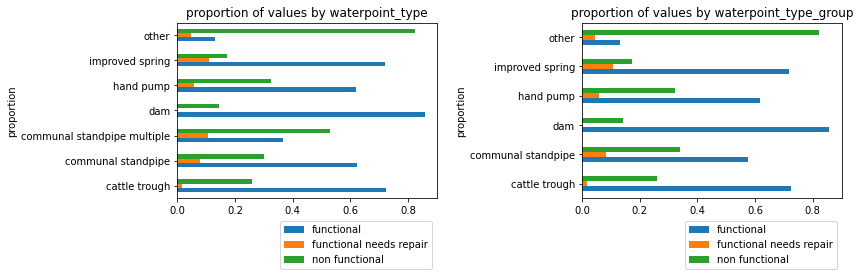

In [79]:
plot_proportion(df, ['waterpoint_type', 'waterpoint_type_group'])

In [80]:
df[['waterpoint_type', 'waterpoint_type_group']].value_counts()

waterpoint_type              waterpoint_type_group
communal standpipe           communal standpipe       28522
hand pump                    hand pump                17488
other                        other                     6380
communal standpipe multiple  communal standpipe        6103
improved spring              improved spring            784
cattle trough                cattle trough              116
dam                          dam                          7
dtype: int64

We can see that `waterpoint_type` has communal standpipe divided into two groups.  From the proportion chart this does appear to be an informative difference.  So we will keep `waterpint_type` and drop `waterpint_type_group`

In [81]:
prep.cat_cols.difference_update({'waterpoint_type_group'})

In [82]:
### Custom Transformer

We want to limit the number of records in our categorical columns.  To do that I have created a function to use with FunctionTransformer located in the helpers.py file.  It takes the top values and remaps all other values to other.


In [83]:
# test the transformer function
filter_top_cats(df[prep.cat_cols])

,source,subvillage,region,funder,quality_group,public_meeting,wpt_name,district_code,scheme_name,installer,quantity,payment_type,waterpoint_type,lga,permit,extraction_type_class,management_group,water_quality,recorded_by,status_group,basin,ward,management
id,,,,,,,,,,,,,,,,,,,,,,,
69572,spring,other,Iringa,other,good,True,none,5,other,other,enough,other,communal standpipe,other,False,gravity,user-group,soft,GeoData Consultants Ltd,functional,other,other,vwc
8776,rainwater harvesting,other,other,other,good,other,Zahanati,2,other,other,insufficient,never pay,communal standpipe,other,True,gravity,user-group,soft,GeoData Consultants Ltd,functional,Lake Victoria,other,wug
34310,other,Majengo,other,other,good,True,other,4,other,other,enough,per bucket,communal standpipe multiple,other,True,gravity,user-group,soft,GeoData Consultants Ltd,functional,Pangani,other,vwc
67743,machine dbh,other,other,other,good,True,other,other,other,other,dry,never pay,communal standpipe multiple,other,True,submersible,user-group,soft,GeoData Consultants Ltd,non functional,other,other,vwc
19728,rainwater harvesting,other,other,other,good,True,Shuleni,1,other,other,seasonal,never pay,communal standpipe,other,True,gravity,other,soft,GeoData Consultants Ltd,functional,Lake Victoria,other,other
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
60739,spring,other,Kilimanjaro,other,good,True,other,5,other,other,enough,per bucket,communal standpipe,other,True,gravity,user-group,soft,GeoData Consultants Ltd,functional,Pangani,other,water board
27263,river,other,Iringa,other,good,True,other,4,other,other,enough,other,communal standpipe,Njombe,True,gravity,user-group,soft,GeoData Consultants Ltd,functional,Rufiji,other,vwc
37057,machine dbh,other,Mbeya,other,other,True,other,other,other,other,enough,monthly,hand pump,other,False,handpump,user-group,other,GeoData Consultants Ltd,functional,Rufiji,other,vwc


In [84]:
# Test the new transformer
ft = FunctionTransformer(func = filter_top_cats, kw_args={'t':.05, 'method':'percent'})
v = ft.fit_transform(df[['waterpoint_type', 'waterpoint_type_group']])
v.value_counts()

waterpoint_type              waterpoint_type_group
communal standpipe           communal standpipe       28522
hand pump                    hand pump                17488
other                        other                     7287
communal standpipe multiple  communal standpipe        6103
dtype: int64

In [85]:
cat_cols = list(prep.cat_cols)
ft.fit_transform(df[cat_cols])

,source,subvillage,region,funder,quality_group,public_meeting,wpt_name,district_code,scheme_name,installer,quantity,payment_type,waterpoint_type,lga,permit,extraction_type_class,management_group,water_quality,recorded_by,status_group,basin,ward,management
id,,,,,,,,,,,,,,,,,,,,,,,
69572,spring,other,Iringa,other,good,True,none,5,other,other,enough,annually,communal standpipe,other,False,gravity,user-group,soft,GeoData Consultants Ltd,functional,Lake Nyasa,other,vwc
8776,other,other,other,other,good,other,other,2,other,other,insufficient,never pay,communal standpipe,other,True,gravity,user-group,soft,GeoData Consultants Ltd,functional,Lake Victoria,other,wug
34310,other,other,other,other,good,True,other,4,other,other,enough,per bucket,communal standpipe multiple,other,True,gravity,user-group,soft,GeoData Consultants Ltd,functional,Pangani,other,vwc
67743,machine dbh,other,other,other,good,True,other,other,other,other,dry,never pay,communal standpipe multiple,other,True,submersible,user-group,soft,GeoData Consultants Ltd,non functional,Ruvuma / Southern Coast,other,vwc
19728,other,other,Kagera,other,good,True,other,1,other,other,seasonal,never pay,communal standpipe,other,True,gravity,other,soft,GeoData Consultants Ltd,functional,Lake Victoria,other,other
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
60739,spring,other,Kilimanjaro,other,good,True,other,5,other,other,enough,per bucket,communal standpipe,other,True,gravity,user-group,soft,GeoData Consultants Ltd,functional,Pangani,other,other
27263,river,other,Iringa,other,good,True,other,4,other,other,enough,annually,communal standpipe,other,True,gravity,user-group,soft,GeoData Consultants Ltd,functional,Rufiji,other,vwc
37057,machine dbh,other,Mbeya,other,other,True,other,7,other,other,enough,monthly,hand pump,other,False,handpump,user-group,other,GeoData Consultants Ltd,functional,Rufiji,other,vwc


### Pipeline test
Now we want to apply this in our pipeline to our cat_cols

In [86]:
cont_cols = ['gps_height', 'construction_year']

continuous_pipeline = Pipeline(
        steps = [
            ('imp', SimpleImputer(missing_values = 0, strategy='median'))
        ])

##

population_cols = ['population']

population_pipeline = Pipeline(
        steps = [
            ('imp1', SimpleImputer(missing_values = 1, strategy='constant', fill_value=0)),
            ('imp0', SimpleImputer(missing_values = 0, strategy='median')),
            ('log', FunctionTransformer(np.log))
        ])

##

latlong_cols = ['latitude', 'longitude']

latlong_pipeline = Pipeline(
        steps = [
            # Fill with median for now, will try other strategy in tuning
            ('imp0', SimpleImputer(missing_values = 0, strategy='median')),
            ('imp-0', SimpleImputer(missing_values = -2e-08, strategy='median'))
        ])

##

log_cols = ['amount_tsh', 'num_private']
log_pipeline = Pipeline(
        steps = [
            ('imp', SimpleImputer(missing_values = 0, strategy='median')),
            ('log', FunctionTransformer(np.log))
        ])

##

cat_cols = list(prep.cat_cols)
cat_pipeline = Pipeline(
        steps = [
            # most_frequent is impossibly slow
            #('imp', SimpleImputer(strategy='most_frequent')),
            ('imp', SimpleImputer(strategy='constant', fill_value='unknown')),
            ('reduce', FunctionTransformer(func = filter_top_cats, 
                                           kw_args={'t':.05, 'method':'percent'}))
        ])



ct = ColumnTransformer(
    transformers = [
        ('cont', continuous_pipeline, cont_cols),
        ('pop', population_pipeline, population_cols),
        ('latlong', latlong_pipeline, latlong_cols),
        ('log', log_pipeline, log_cols),
        ('cats', cat_pipeline, cat_cols)
        
    ])

result = ct.fit_transform(df)
df_tx = pd.DataFrame(result, columns=get_feature_names(ct))
df_tx.head(2)

,cont__gps_height,cont__construction_year,pop__population,latlong__latitude,latlong__longitude,log__amount_tsh,log__num_private,cats__source,cats__subvillage,cats__region,cats__funder,cats__quality_group,cats__public_meeting,cats__wpt_name,cats__district_code,cats__scheme_name,cats__installer,cats__quantity,cats__payment_type,cats__waterpoint_type,cats__lga,cats__permit,cats__extraction_type_class,cats__management_group,cats__water_quality,cats__recorded_by,cats__status_group,cats__basin,cats__ward,cats__management
0,1390.0,1999.0,4.691348,-9.856322,34.938093,8.699515,2.70805,spring,other,Iringa,other,good,True,none,5,other,other,enough,annually,communal standpipe,other,False,gravity,user-group,soft,GeoData Consultants Ltd,functional,Lake Nyasa,other,vwc
1,1399.0,2010.0,5.63479,-2.147466,34.698766,5.521461,2.70805,other,other,other,other,good,unknown,other,2,unknown,other,insufficient,never pay,communal standpipe,other,True,gravity,user-group,soft,GeoData Consultants Ltd,functional,Lake Victoria,other,wug


In [87]:
ct

ColumnTransformer(transformers=[('cont',
                                 Pipeline(steps=[('imp',
                                                  SimpleImputer(missing_values=0,
                                                                strategy='median'))]),
                                 ['gps_height', 'construction_year']),
                                ('pop',
                                 Pipeline(steps=[('imp1',
                                                  SimpleImputer(fill_value=0,
                                                                missing_values=1,
                                                                strategy='constant')),
                                                 ('imp0',
                                                  SimpleImputer(missing_values=0,
                                                                strategy='median')),
                                                 ('log',
                                                  FunctionTransformer(func=<ufunc 'log...
                                                  FunctionTransformer(func=<function filter_top_cats at 0x11bec3700>,
                                                                      kw_args={'method': 'percent',
                                                                               't': 0.05}))]),
                                 ['source', 'subvillage', 'region', 'funder',
                                  'quality_group', 'public_meeting', 'wpt_name',
                                  'district_code', 'scheme_name', 'installer',
                                  'quantity', 'payment_type', 'waterpoint_type',
                                  'lga', 'permit', 'extraction_type_class',
                                  'management_group', 'water_quality',
                                  'recorded_by', 'status_group', 'basin',
                                  'ward', 'management'])])

## more than 10 unique values

Develop a strategy for dealing with categorical columns with high cardinality

In [88]:
# create a list of categorical columns
#cat_cols = set(df2.select_dtypes('object').columns)

cat_cols_large = df[prep.cat_cols].columns[df[prep.cat_cols].nunique() > 10]

df[sorted(cat_cols_large)].head()

,district_code,funder,installer,lga,management,region,scheme_name,subvillage,ward,wpt_name
id,,,,,,,,,,
69572,5,Roman,Roman,Ludewa,vwc,Iringa,Roman,Mnyusi B,Mundindi,none
8776,2,Grumeti,GRUMETI,Serengeti,wug,Mara,NaN,Nyamara,Natta,Zahanati
34310,4,Lottery Club,World vision,Simanjiro,vwc,Manyara,Nyumba ya mungu pipe scheme,Majengo,Ngorika,Kwa Mahundi
67743,63,Unicef,UNICEF,Nanyumbu,vwc,Mtwara,NaN,Mahakamani,Nanyumbu,Zahanati Ya Nanyumbu
19728,1,Action In A,Artisan,Karagwe,other,Kagera,NaN,Kyanyamisa,Nyakasimbi,Shuleni


### funder

In [89]:
df['funder'].value_counts(normalize=True)

Government Of Tanzania    0.162898
Danida                    0.055841
Hesawa                    0.039487
Rwssp                     0.024639
World Bank                0.024191
                            ...   
Selestine Mganga          0.000018
Mwanza                    0.000018
Cgc                       0.000018
Government /sda           0.000018
Simav                     0.000018
Name: funder, Length: 1897, dtype: float64

The source of funding doesn't seem like a value that would have much impact on the well, especially if we assume that all they did was give money.  There are 1897 Categorical values here so it could get very messy.  I will drop this column.

In [90]:
prep.cat_cols.difference_update({'funder'})

### installer

In [91]:
df['installer'].value_counts().head()

DWE           17402
Government     1825
RWE            1206
Commu          1060
DANIDA         1050
Name: installer, dtype: int64

In [92]:
df['installer'].value_counts(normalize=True).head(25)

DWE                   0.312171
Government            0.032738
RWE                   0.021634
Commu                 0.019015
DANIDA                0.018836
KKKT                  0.016109
Hesawa                0.015069
0                     0.013938
TCRS                  0.012683
Central government    0.011158
CES                   0.010943
Community             0.009920
DANID                 0.009902
District Council      0.009884
HESAWA                0.009669
LGA                   0.007319
World vision          0.007319
WEDECO                0.007122
TASAF                 0.007104
District council      0.007032
Gover                 0.006871
AMREF                 0.005902
TWESA                 0.005669
WU                    0.005400
Dmdd                  0.005148
Name: installer, dtype: float64

We will keep this and reduce the size in the pipeline

### `wpt_name`

In [93]:
df['wpt_name'].duplicated().sum()

22000

In [94]:
len(df['wpt_name'].unique()) / len(df)


0.6296296296296297

In [95]:
df['wpt_name'][df['wpt_name'].duplicated(keep=False)]

id
69572            none
8776         Zahanati
34310     Kwa Mahundi
19728         Shuleni
54551    Tushirikiane
             ...     
44616         Shuleni
30410       Sekondari
44885             Kwa
48348       Kwa Peter
37057         Mashine
Name: wpt_name, Length: 26472, dtype: object

In [96]:
df[df['wpt_name'] == 'Zahanati']

,amount_tsh,date_recorded,funder,gps_height,installer,longitude,latitude,wpt_name,num_private,basin,subvillage,region,region_code,district_code,lga,ward,population,public_meeting,recorded_by,scheme_management,scheme_name,permit,construction_year,extraction_type,extraction_type_group,extraction_type_class,management,management_group,payment,payment_type,water_quality,quality_group,quantity,quantity_group,source,source_type,source_class,waterpoint_type,waterpoint_type_group,status_group
id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
8776,0.0,2013-03-06,Grumeti,1399,GRUMETI,34.698766,-2.147466,Zahanati,0,Lake Victoria,Nyamara,Mara,20,2,Serengeti,Natta,280,NaN,GeoData Consultants Ltd,Other,NaN,True,2010,gravity,gravity,gravity,wug,user-group,never pay,never pay,soft,good,insufficient,insufficient,rainwater harvesting,rainwater harvesting,surface,communal standpipe,communal standpipe,functional
22961,0.0,2013-08-03,Olgilai Village Community,1583,Olgilai village community,36.721127,-3.339812,Zahanati,0,Pangani,Soyekiutu,Arusha,2,2,Arusha Rural,Oltroto,150,True,GeoData Consultants Ltd,VWC,Olgilai pipe line,True,2009,gravity,gravity,gravity,vwc,user-group,never pay,never pay,soft,good,enough,enough,spring,spring,groundwater,communal standpipe,communal standpipe,non functional
54801,0.0,2013-02-04,Government Of Tanzania,1694,DWE,29.768009,-4.471809,Zahanati,0,Lake Tanganyika,Kisoro,Kigoma,16,2,Kigoma Rural,Mkigo,1,True,GeoData Consultants Ltd,Water authority,NaN,False,2004,other,other,other,private operator,commercial,never pay,never pay,soft,good,dry,dry,rainwater harvesting,rainwater harvesting,surface,communal standpipe,communal standpipe,non functional
7171,0.0,2012-10-15,Rural Water Supply And Sanitat,0,DWE,32.166148,-3.647947,Zahanati,0,Lake Tanganyika,Ishilanga,Shinyanga,17,5,Bukombe,Masumbwe,0,True,GeoData Consultants Ltd,Parastatal,NaN,True,0,nira/tanira,nira/tanira,handpump,parastatal,parastatal,unknown,unknown,soft,good,seasonal,seasonal,rainwater harvesting,rainwater harvesting,surface,hand pump,hand pump,functional
68037,0.0,2011-04-12,Socie,0,Commu,35.865939,-5.973474,Zahanati,0,Wami / Ruvu,Makulu,Dodoma,1,5,Dodoma Urban,Chihanga,0,True,GeoData Consultants Ltd,VWC,Nzas,False,0,mono,mono,motorpump,vwc,user-group,pay per bucket,per bucket,soft,good,insufficient,insufficient,machine dbh,borehole,groundwater,communal standpipe,communal standpipe,functional
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
32946,0.0,2011-07-12,Ded,0,DED,31.715917,-2.523554,Zahanati,0,Lake Victoria,Mahakama,Kagera,18,8,Chato,Nyamirembe,0,True,GeoData Consultants Ltd,VWC,Mapinduzi,True,0,mono,mono,motorpump,vwc,user-group,never pay,never pay,soft,good,insufficient,insufficient,machine dbh,borehole,groundwater,communal standpipe multiple,communal standpipe,non functional
20412,0.0,2012-12-16,Vifafi,1219,VIFAFI,33.391844,-1.832841,Zahanati,0,Lake Victoria,Ranjugo,Mara,20,3,Musoma Rural,Bwasi,56,NaN,GeoData Consultants Ltd,Parastatal,NaN,True,2011,gravity,gravity,gravity,parastatal,parastatal,never pay,never pay,soft,good,insufficient,insufficient,rainwater harvesting,rainwater harvesting,surface,communal standpipe,communal standpipe,functional
48532,250.0,2013-01-24,Twesa,1155,TWESA,30.255017,-4.634894,Zahanati,0,Lake Tanganyika,Nyamunyinya,Kigoma,16,2,Kasulu,Rungwe Mpya,450,True,GeoData Consultants Ltd,Water authority,TWESA,True,2000,gravity,gravity,gravity,vwc,user-group,pay monthly,monthly,soft,good,enough,enough,river,river/lake,surface,communal standpipe multiple,communal standpipe,functional


There are many duplicates for `wpt_name` that are not duplicate wells because they are not in the same region.  This column doesn't appear to be useful.  Drop it.

In [97]:
prep.cat_cols.difference_update({'wpt_name'})

### subvillage, region, region_code, lga, ward, district_code

These are all regional data.  They need to be condensed into one variable.  I think we could try to combine this with population.

In [98]:
df[['subvillage', 'region', 'region_code', 'lga', 'ward', 'district_code']].nunique()

subvillage       19287
region              21
region_code         27
lga                125
ward              2092
district_code       20
dtype: int64

Its interesting that there are 21 regions and 27 region_codes.

The districts do not align with the regions but there are also 20 districts.

At this point I think we get enough geographic overlap with the `district_code` and the `region`.  The other data appears too granular and could be affected by sampling error.

We will keep `district_code` and `region` and drop the rest of the region data.

In [99]:
prep.cat_cols.difference_update({'subvillage', 'region_code', 'lga', 'ward'})

# change to object so it will be treaded as a categorical for onehotencoding
df['district_code'] = df['district_code'].astype('object')

### lga	

In [100]:
df['lga'].value_counts()

Njombe          2503
Arusha Rural    1252
Moshi Rural     1251
Bariadi         1177
Rungwe          1106
                ... 
Moshi Urban       79
Kigoma Urban      71
Arusha Urban      63
Lindi Urban       21
Nyamagana          1
Name: lga, Length: 125, dtype: int64

#`lga` is more geographic information.  The interaction between this and region code might prove useful.  We can keep it and reduce its scope in the pipeline.

### scheme name

In [101]:
df['scheme_name'].value_counts()

K                                        682
None                                     644
Borehole                                 546
Chalinze wate                            405
M                                        400
                                        ... 
Ngumbaru Extension                         1
Magila-Mkumbara wate                       1
nyaluhande                                 1
Tanzania Egypt Technical Co-Operation      1
Solo                                       1
Name: scheme_name, Length: 2696, dtype: int64

`scheme_name` seems useful.  It would expect that the company that manages the well would have a bearing on how long the well functions.  Try to find a way to group them into bins.

In [102]:
df['scheme_name'].nunique()

2696

scheme_name  
K                682
None             644
Borehole         546
Chalinze wate    405
dtype: int64

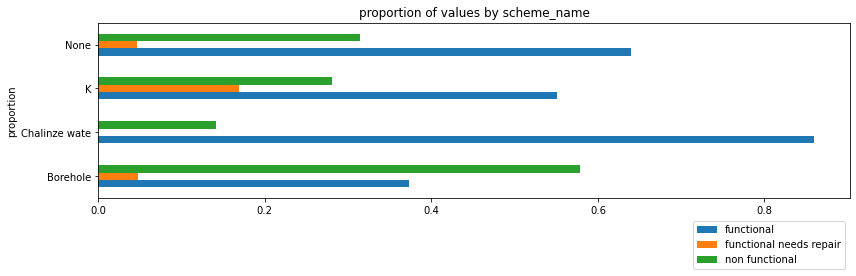

In [103]:
vc = df['scheme_name'].value_counts()
top_schemes = vc.index[vc > 400]
top_schemes
#top_schemes = df[df.scheme_name.isin(top_schemes)].groupby(['scheme_name', 'status_group']).status_group.count()
#top_schemes.unstack()

plot_proportion(df[df.scheme_name.isin(top_schemes)], ['scheme_name'])

This looks significant at least for the top companies

### public_meeting, permit

In [104]:
df[['public_meeting', 'permit']].head()

,public_meeting,permit
id,,
69572,True,False
8776,NaN,True
34310,True,True
67743,True,True
19728,True,True


In [105]:
df[['public_meeting', 'permit']].isna().sum()

public_meeting    3334
permit            3056
dtype: int64

In [106]:
df[['public_meeting', 'permit']].median()

public_meeting    1.0
permit            1.0
dtype: float64

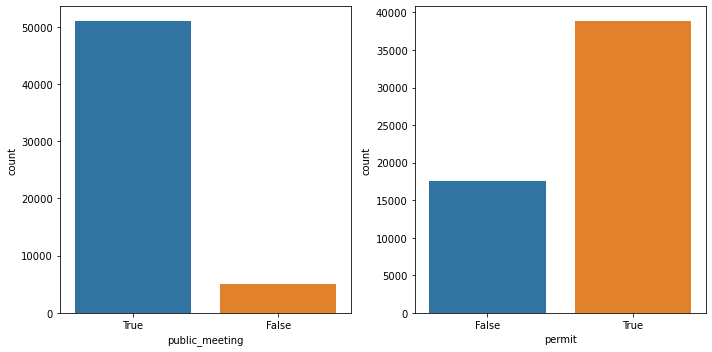

In [107]:
fig, (ax1, ax2) = plt.subplots(1,2, figsize=(10,5))
sns.countplot(x=df['public_meeting'], ax=ax1)
sns.countplot(x=df['permit'], ax=ax2)
plt.tight_layout()

Fill the missing values with True (the median) and map to 0,1.

Create a pipeline to do this.

In [108]:
# remove from categorical cols
prep.cat_cols.difference_update({'public_meeting', 'permit'})

In [109]:
# def boolstring_to_int(s):
#     return s.astype('bool').astype('int')

bool_cols = ['public_meeting', 'permit']
bool_pipe = Pipeline(
                steps = [
                    ('imp', SimpleImputer(strategy='median')),
                    ('bool', FunctionTransformer(boolstring_to_int))
                ])

# test it
bool_pipe.fit_transform(df[['public_meeting', 'permit']])

array([[1, 0],
       [1, 1],
       [1, 1],
       ...,
       [1, 0],
       [1, 1],
       [1, 1]])

### `recorded_by`
`recorded_by` only has one value. The column does not convey any information about the target variable.


In [110]:
df['recorded_by'].value_counts()

GeoData Consultants Ltd    59400
Name: recorded_by, dtype: int64

In [111]:
prep.cat_cols.difference_update({'recorded_by'})

## Pipeline Test

In [112]:
## Continuous columns
cont_cols = ['gps_height', 'construction_year']
continuous_pipeline = Pipeline(
        steps = [
            ('imp', SimpleImputer(missing_values = 0, strategy='median'))
        ])

## Population
population_cols = ['population']
population_pipeline = Pipeline(
        steps = [
            ('imp1', SimpleImputer(missing_values = 1, strategy='constant', fill_value=0)),
            ('imp0', SimpleImputer(missing_values = 0, strategy='median')),
            ('log', FunctionTransformer(np.log))
        ])

## Latitude and Longitude
latlong_cols = ['latitude', 'longitude']
latlong_pipeline = Pipeline(
        steps = [
            # Fill with median for now, will try other strategy in tuning
            ('imp0', SimpleImputer(missing_values = 0, strategy='median')),
            ('imp-0', SimpleImputer(missing_values = -2e-08, strategy='median'))
        ])

## Columns to Log Transform
log_cols = ['amount_tsh', 'num_private']
log_pipeline = Pipeline(
        steps = [
            ('imp', SimpleImputer(missing_values = 0, strategy='median')),
            ('log', FunctionTransformer(np.log))
        ])

## Categorical columns
cat_cols = list(prep.cat_cols)
cat_pipeline = Pipeline(
        steps = [
            # most_frequent is impossibly slow
            ('imp', SimpleImputer(strategy='most_frequent')),
            # ('imp', SimpleImputer(strategy='constant', fill_value='unknown')),
            ('reduce', FunctionTransformer(func = filter_top_cats, 
                                           kw_args={'t':.05, 'method':'percent'}))
        ])


## 
bool_cols = ['public_meeting', 'permit']
bool_pipeline = Pipeline(
        steps = [
            ('imp', SimpleImputer(strategy='median')),
            ('bool', FunctionTransformer(boolstring_to_int))
        ])

## Main Column Transformer
ct = ColumnTransformer(
    transformers = [
        ('cont', continuous_pipeline, cont_cols),
        ('pop', population_pipeline, population_cols),
        ('latlong', latlong_pipeline, latlong_cols),
        ('log', log_pipeline, log_cols),
        ('cats', cat_pipeline, cat_cols),
        ('bool', bool_pipeline, bool_cols)
    ],

)

result = ct.fit_transform(df)
df_tx = pd.DataFrame(result, columns=get_feature_names(ct))
df_tx.head()

,cont__gps_height,cont__construction_year,pop__population,latlong__latitude,latlong__longitude,log__amount_tsh,log__num_private,cats__source,cats__region,cats__quality_group,cats__district_code,cats__scheme_name,cats__installer,cats__quantity,cats__payment_type,cats__waterpoint_type,cats__extraction_type_class,cats__management_group,cats__water_quality,cats__status_group,cats__basin,cats__management,bool__public_meeting,bool__permit
0,1390.0,1999.0,4.691348,-9.856322,34.938093,8.699515,2.70805,spring,Iringa,good,5,other,other,enough,annually,communal standpipe,gravity,user-group,soft,functional,Lake Nyasa,vwc,1,0
1,1399.0,2010.0,5.63479,-2.147466,34.698766,5.521461,2.70805,other,other,good,2,K,other,insufficient,never pay,communal standpipe,gravity,user-group,soft,functional,Lake Victoria,wug,1,1
2,686.0,2009.0,5.521461,-3.821329,37.460664,3.218876,2.70805,other,other,good,4,other,other,enough,per bucket,communal standpipe multiple,gravity,user-group,soft,functional,Pangani,vwc,1,1
3,263.0,1986.0,4.060443,-11.155298,38.486161,5.521461,2.70805,machine dbh,other,good,other,K,other,dry,never pay,communal standpipe multiple,submersible,user-group,soft,non functional,Ruvuma / Southern Coast,vwc,1,1
4,1167.0,2000.0,5.298317,-1.825359,31.130847,5.521461,2.70805,other,Kagera,good,1,K,other,seasonal,never pay,communal standpipe,gravity,other,soft,functional,Lake Victoria,other,1,1


In [113]:
%timeit -n1 -r1 ct.fit_transform(df)

18.8 s ± 0 ns per loop (mean ± std. dev. of 1 run, 1 loop each)


That is going to take way too long when applying per fold in a cross validation.  Try to track down why it is taking so long.

#### Time Individual Pipelines

In [114]:
## Continuous columns
cont_cols = ['gps_height', 'construction_year']
continuous_pipeline = Pipeline(
        steps = [
            ('imp', SimpleImputer(missing_values = 0, strategy='median'))
        ])

%timeit continuous_pipeline.fit_transform(df[cont_cols])

29.4 ms ± 7.06 ms per loop (mean ± std. dev. of 7 runs, 10 loops each)


In [115]:
## Population
population_cols = ['population']
population_pipeline = Pipeline(
        steps = [
            ('imp1', SimpleImputer(missing_values = 1, strategy='constant', fill_value=0)),
            ('imp0', SimpleImputer(missing_values = 0, strategy='median')),
            ('log', FunctionTransformer(np.log))
        ])

%timeit population_pipeline.fit_transform(df[population_cols])

19.8 ms ± 3.49 ms per loop (mean ± std. dev. of 7 runs, 10 loops each)


In [116]:
## Latitude and Longitude
latlong_cols = ['latitude', 'longitude']
latlong_pipeline = Pipeline(
        steps = [
            # Fill with median for now, will try other strategy in tuning
            ('imp0', SimpleImputer(missing_values = 0, strategy='median')),
            ('imp-0', SimpleImputer(missing_values = -2e-08, strategy='median'))
        ])

%timeit latlong_pipeline.fit_transform(df[latlong_cols])

58 ms ± 9.96 ms per loop (mean ± std. dev. of 7 runs, 10 loops each)


In [117]:
## Columns to Log Transform
log_cols = ['amount_tsh', 'num_private']
log_pipeline = Pipeline(
        steps = [
            ('imp', SimpleImputer(missing_values = 0, strategy='median')),
            ('log', FunctionTransformer(np.log))
        ])

%timeit log_pipeline.fit_transform(df[log_cols])

32.7 ms ± 8.31 ms per loop (mean ± std. dev. of 7 runs, 10 loops each)


In [118]:
## Categorical columns
cat_cols = list(prep.cat_cols)
cat_pipeline = Pipeline(
        steps = [
            ('imp', SimpleImputer(strategy='most_frequent')),
            ('reduce', FunctionTransformer(func = filter_top_cats, 
                                           kw_args={'t':.05, 'method':'percent'}))
        ])

%timeit cat_pipeline.fit_transform(df[cat_cols])

14.3 s ± 2.99 s per loop (mean ± std. dev. of 7 runs, 1 loop each)


**This is the time culprit ^**

In [119]:
## 
bool_cols = ['public_meeting', 'permit']
bool_pipeline = Pipeline(
        steps = [
            ('imp', SimpleImputer(strategy='median')),
            ('bool', FunctionTransformer(boolstring_to_int))
        ])

%timeit bool_pipeline.fit_transform(df[bool_cols])

23.8 ms ± 3.86 ms per loop (mean ± std. dev. of 7 runs, 10 loops each)


It turns out that the "most_Frequent" strategy with SimpleImputer is known for being excessively slow. See [this article](https://datascience.stackexchange.com/questions/66034/sklearn-simpleimputer-too-slow-for-categorical-data-represented-as-string-values) on the Data Science stackeschange.  Instead of imputing with most frequent we will try filling with 'unknown'.

In [120]:
## Categorical columns
cat_cols = list(prep.cat_cols)
cat_pipeline = Pipeline(
        steps = [
            # ('imp', SimpleImputer(strategy='most_frequent')),
            ('imp', SimpleImputer(strategy='constant', fill_value='unknown')),
            ('reduce', FunctionTransformer(func = filter_top_cats, 
                                           kw_args={'t':.05, 'method':'percent'}))
        ])

%timeit cat_pipeline.fit_transform(df[cat_cols])

1.12 s ± 51.9 ms per loop (mean ± std. dev. of 7 runs, 1 loop each)


That is now tolerable.  Incorporate that into the pipeline.

In [121]:
## Continuous columns
cont_cols = ['gps_height', 'construction_year']
continuous_pipeline = Pipeline(
        steps = [
            ('imp', SimpleImputer(missing_values = 0, strategy='median'))
        ])

## Population
population_cols = ['population']
population_pipeline = Pipeline(
        steps = [
            ('imp1', SimpleImputer(missing_values = 1, strategy='constant', fill_value=0)),
            ('imp0', SimpleImputer(missing_values = 0, strategy='median')),
            ('log', FunctionTransformer(np.log))
        ])

## Latitude and Longitude
latlong_cols = ['latitude', 'longitude']
latlong_pipeline = Pipeline(
        steps = [
            # Fill with median for now, will try other strategy in tuning
            ('imp0', SimpleImputer(missing_values = 0, strategy='median')),
            ('imp-0', SimpleImputer(missing_values = -2e-08, strategy='median'))
        ])

## Columns to Log Transform
log_cols = ['amount_tsh', 'num_private']
log_pipeline = Pipeline(
        steps = [
            ('imp', SimpleImputer(missing_values = 0, strategy='median')),
            ('log', FunctionTransformer(np.log))
        ])

## Categorical columns
cat_cols = list(prep.cat_cols)
cat_pipeline = Pipeline(
        steps = [
            # most_frequent is impossibly slow
            # ('imp', SimpleImputer(strategy='most_frequent')),
            ('imp', SimpleImputer(strategy='constant', fill_value='unknown')),
            ('reduce', FunctionTransformer(func = filter_top_cats, 
                                           kw_args={'t':.05, 'method':'percent'}))
        ])


## 
bool_cols = ['public_meeting', 'permit']
bool_pipeline = Pipeline(
        steps = [
            ('imp', SimpleImputer(strategy='median')),
            ('bool', FunctionTransformer(boolstring_to_int))
        ])

## Main Column Transformer
ct = ColumnTransformer(
    transformers = [
        ('cont', continuous_pipeline, cont_cols),
        ('pop', population_pipeline, population_cols),
        ('latlong', latlong_pipeline, latlong_cols),
        ('log', log_pipeline, log_cols),
        ('cats', cat_pipeline, cat_cols),
        ('bool', bool_pipeline, bool_cols)
    ],

)

result = ct.fit_transform(df)
df_tx = pd.DataFrame(result, columns=get_feature_names(ct))
df_tx.head()

,cont__gps_height,cont__construction_year,pop__population,latlong__latitude,latlong__longitude,log__amount_tsh,log__num_private,cats__source,cats__region,cats__quality_group,cats__district_code,cats__scheme_name,cats__installer,cats__quantity,cats__payment_type,cats__waterpoint_type,cats__extraction_type_class,cats__management_group,cats__water_quality,cats__status_group,cats__basin,cats__management,bool__public_meeting,bool__permit
0,1390.0,1999.0,4.691348,-9.856322,34.938093,8.699515,2.70805,spring,Iringa,good,5,other,other,enough,annually,communal standpipe,gravity,user-group,soft,functional,Lake Nyasa,vwc,1,0
1,1399.0,2010.0,5.63479,-2.147466,34.698766,5.521461,2.70805,other,other,good,2,unknown,other,insufficient,never pay,communal standpipe,gravity,user-group,soft,functional,Lake Victoria,wug,1,1
2,686.0,2009.0,5.521461,-3.821329,37.460664,3.218876,2.70805,other,other,good,4,other,other,enough,per bucket,communal standpipe multiple,gravity,user-group,soft,functional,Pangani,vwc,1,1
3,263.0,1986.0,4.060443,-11.155298,38.486161,5.521461,2.70805,machine dbh,other,good,other,unknown,other,dry,never pay,communal standpipe multiple,submersible,user-group,soft,non functional,Ruvuma / Southern Coast,vwc,1,1
4,1167.0,2000.0,5.298317,-1.825359,31.130847,5.521461,2.70805,other,Kagera,good,1,unknown,other,seasonal,never pay,communal standpipe,gravity,other,soft,functional,Lake Victoria,other,1,1


# `date_recorded`

From the description we could assume that the date is unimportant.  The value description says that date_recorded is the date the entry was made into the system.  But we know that these descriptions aren't always accurate and the date could reflect the date the status of the pump was observed.  Even if it is the entry date we might expect more pumps to fail as time goes on.

It may also be worth creating a feature for `years_since_install` to indicate how many years have passed between date_recorded and `construction_year`

<AxesSubplot:xlabel='date_recorded', ylabel='Count'>

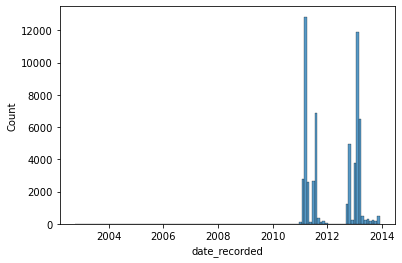

In [122]:
# what is the distribution of date_recorded
date_recorded = pd.to_datetime(df['date_recorded'])
sns.histplot(date_recorded)

digging deeper we want to see if the proportion records in each status group by season varies.  In other words to some seasons have a proportionally higher number of status reported.

In [123]:
# See if season matters
from datetime import date, datetime

Y = 2000 # dummy leap year to allow input X-02-29 (leap day)
seasons = [('winter', (date(Y,  1,  1),  date(Y,  3, 20))),
           ('spring', (date(Y,  3, 21),  date(Y,  6, 20))),
           ('summer', (date(Y,  6, 21),  date(Y,  9, 22))),
           ('autumn', (date(Y,  9, 23),  date(Y, 12, 20))),
           ('winter', (date(Y, 12, 21),  date(Y, 12, 31)))]

# return the season for each date
def get_season(dt):
    if isinstance(dt, datetime):
        dt = dt.date()
    dt = dt.replace(year=Y)
    
    for season, (start, end) in seasons:
        if start <= dt <= end:
            break
    return season

# map dates to seasons
season_reported = date_recorded.map(get_season)

<AxesSubplot:xlabel='date_recorded'>

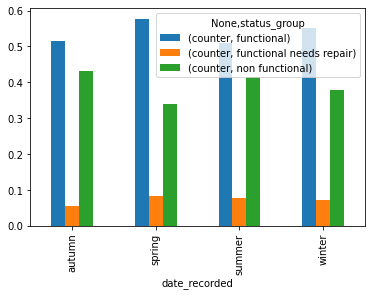

In [124]:
# Plot proportion of records in each status group by season 

# add season to tmp_df
tmp_df = pd.concat([df['status_group'], season_reported], axis = 1)

# a column of 1's to count
tmp_df['counter'] = 1

# group and plot
grouped = tmp_df.groupby(['date_recorded', 'status_group']).count()
grouped = grouped.unstack()
grouped = grouped.groupby('date_recorded').apply(lambda x: x / int(x.sum(axis = 1)))
grouped.plot.bar()

From this it looks like season does not have a significant impact on the `status_group`

The custom transformer for the date column is included in [functions.py](functions.py)

In [125]:
# Test the custom date transformer
date_cols = ['date_recorded', 'construction_year']
date_pipeline = Pipeline(
        steps = [
            ('date', DatePrep(strategy = 'median'))
        ])

## Main Column Transformer
ct = ColumnTransformer(
    transformers = [
        ('date', date_pipeline, date_cols),
    ],
)

result = ct.fit_transform(df)

df_tx = pd.DataFrame(result, columns=get_feature_names(ct))
df_tx.head()

<string>:1: FutureWarning: DataFrame.mean and DataFrame.median with numeric_only=None will include datetime64 and datetime64tz columns in a future version.


,date__date_recorded,date__construction_year
0,15047.0,12.0
1,15770.0,3.0
2,15761.0,4.0
3,15733.0,27.0
4,15168.0,11.0


### Check work

In [126]:
# check for missing values
df_tx.isna().sum()

date__date_recorded        0
date__construction_year    0
dtype: int64

# Final Pipeline

Lastly I add a MinMaxSampler to each numerical column for algorthms that work better with scalled values.

In [132]:
# view cat_cols to include explicitly in pipeline
print(list(prep.cat_cols))

['source', 'region', 'quality_group', 'district_code', 'scheme_name', 'installer', 'quantity', 'payment_type', 'waterpoint_type', 'extraction_type_class', 'management_group', 'water_quality', 'status_group', 'basin', 'management']


In [128]:
## Continuous columns
cont_cols = ['gps_height', 'construction_year']
continuous_pipeline = Pipeline(
        steps = [
            ('imp', SimpleImputer(missing_values = 0, strategy='median')),
            ('scale', MinMaxScaler())
        ])

## Population
population_cols = ['population']
population_pipeline = Pipeline(
        steps = [
            ('imp1', SimpleImputer(missing_values = 1, strategy='constant', fill_value=0)),
            ('imp0', SimpleImputer(missing_values = 0, strategy='median')),
            ('log', FunctionTransformer(np.log)),
            ('scale', MinMaxScaler())
        ])

## Latitude and Longitude
latlong_cols = ['latitude', 'longitude']
latlong_pipeline = Pipeline(
        steps = [
            # Fill with median for now, will try other strategy in tuning
            ('imp0', SimpleImputer(missing_values = 0, strategy='median')),
            ('imp-0', SimpleImputer(missing_values = -2e-08, strategy='median')),
            ('scale', MinMaxScaler())
        ])

## Columns to Log Transform
log_cols = ['amount_tsh', 'num_private']
log_pipeline = Pipeline(
        steps = [
            ('imp', SimpleImputer(missing_values = 0, strategy='median')),
            ('log', FunctionTransformer(np.log)),
            ('scale', MinMaxScaler())
        ])

## Categorical columns
cat_cols = ['quantity', 'extraction_type_class', 
            'water_quality', 'source', 'source_type', 'scheme_name', 
            'source_class', 'management_group', 
            'payment_type', 'basin', 'payment', 'quality_group', 
            'waterpoint_type', 'management', 'region',
            'scheme_management', 'installer']
cat_pipeline = Pipeline(
        steps = [
            # most_frequent is impossibly slow
            # ('imp', SimpleImputer(strategy='most_frequent')),
            ('imp', SimpleImputer(strategy='constant', fill_value='unknown')),
            ('reduce', FunctionTransformer(func = filter_top_cats, 
                                           kw_args={'t':.05, 'method':'percent'})),
            ('onehot', OneHotEncoder(handle_unknown='ignore', sparse = False))
        ])


## Bool columns
bool_cols = ['public_meeting', 'permit']
bool_pipeline = Pipeline(
        steps = [
            ('imp', SimpleImputer(strategy='median')),
            ('bool', FunctionTransformer(boolstring_to_int))
        ])


## Date columns
date_cols = ['date_recorded', 'construction_year']
date_pipeline = Pipeline(
        steps = [
            ('date', DatePrep(strategy = 'median')),
            ('scale', MinMaxScaler())
        ])


## Main Column Transformer
ct = ColumnTransformer(
    transformers = [
        ('cont', continuous_pipeline, cont_cols),
        ('pop', population_pipeline, population_cols),
        ('latlong', latlong_pipeline, latlong_cols),
        ('log', log_pipeline, log_cols),
        ('cats', cat_pipeline, cat_cols),
        ('bool', bool_pipeline, bool_cols),
        ('date', date_pipeline, date_cols)
    ],

)

ct.fit_transform(X, y)

result = ct.fit_transform(X, y)
df_tx = pd.DataFrame(result, columns=get_feature_names(ct))
df_tx.head()

,cont__gps_height,cont__construction_year,pop__population,latlong__latitude,latlong__longitude,log__amount_tsh,log__num_private,onehot__x0_dry,onehot__x0_enough,onehot__x0_insufficient,onehot__x0_other,onehot__x0_seasonal,onehot__x1_gravity,onehot__x1_handpump,onehot__x1_motorpump,onehot__x1_other,onehot__x1_submersible,onehot__x2_other,onehot__x2_salty,onehot__x2_soft,onehot__x3_machine dbh,onehot__x3_other,onehot__x3_river,onehot__x3_shallow well,onehot__x3_spring,...,onehot__x12_other,onehot__x13_other,onehot__x13_vwc,onehot__x13_wug,onehot__x14_Arusha,onehot__x14_Iringa,onehot__x14_Kagera,onehot__x14_Kilimanjaro,onehot__x14_Mbeya,onehot__x14_Morogoro,onehot__x14_Mwanza,onehot__x14_Shinyanga,onehot__x14_other,onehot__x15_VWC,onehot__x15_WUG,onehot__x15_Water authority,onehot__x15_other,onehot__x15_unknown,onehot__x16_DWE,onehot__x16_other,onehot__x16_unknown,bool__public_meeting,bool__permit,date__date_recorded,date__construction_year
0,0.517483,0.735849,0.415081,0.168353,0.496455,0.717138,0.361936,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,...,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.755408,0.316667
1,0.520629,0.943396,0.513026,0.892122,0.474167,0.496058,0.361936,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,1.0,0.933137,0.166667
2,0.271329,0.924528,0.501261,0.734967,0.731374,0.335880,0.361936,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,1.0,0.930924,0.183333
3,0.123427,0.490566,0.349583,0.046394,0.826875,0.496058,0.361936,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,1.0,0.924041,0.566667
4,0.439510,0.754717,0.478095,0.922364,0.141899,0.496058,0.361936,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,...,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,1.0,0.785152,0.300000


In [129]:
ct

ColumnTransformer(transformers=[('cont',
                                 Pipeline(steps=[('imp',
                                                  SimpleImputer(missing_values=0,
                                                                strategy='median')),
                                                 ('scale', MinMaxScaler())]),
                                 ['gps_height', 'construction_year']),
                                ('pop',
                                 Pipeline(steps=[('imp1',
                                                  SimpleImputer(fill_value=0,
                                                                missing_values=1,
                                                                strategy='constant')),
                                                 ('imp0',
                                                  SimpleImputer(missing_values=0,
                                                                strategy='median')),
                                                 ('log',
                                                  FunctionTr...
                                  'payment', 'quality_group', 'waterpoint_type',
                                  'management', 'region', 'scheme_management',
                                  'installer']),
                                ('bool',
                                 Pipeline(steps=[('imp',
                                                  SimpleImputer(strategy='median')),
                                                 ('bool',
                                                  FunctionTransformer(func=<function boolstring_to_int at 0x11bec38b0>))]),
                                 ['public_meeting', 'permit']),
                                ('date',
                                 Pipeline(steps=[('date', DatePrep()),
                                                 ('scale', MinMaxScaler())]),
                                 ['date_recorded', 'construction_year'])])

# Modeling
The modeling portion of this project continues in the notebook  [2. Modeling.ipynb](2.%20Modeling.ipynb)